In [26]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
import matplotlib.pyplot as plt
import scipy.io as so
import cv2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [3]:
mat=so.loadmat('project_data.mat')
x_train=mat['x_train']
x_test=mat['x_test']
y_train=mat['y_train'].flatten()
y_test=mat['y_test'].flatten()

Train on bottle images

In [ ]:
x_train_bottle = x_train[(y_train==1)]

input_img = Input(shape=(128, 128, 3))
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')


autoencoder.fit(x_train_bottle, x_train_bottle, epochs=12, batch_size=44, shuffle=True)


Epoch 1/12
5/5 [==============================] - 3s 396ms/step - loss: 0.6851
Epoch 2/12
5/5 [==============================] - 2s 388ms/step - loss: 0.6317
Epoch 3/12
5/5 [==============================] - 2s 376ms/step - loss: 0.6077
Epoch 4/12
5/5 [==============================] - 2s 381ms/step - loss: 0.5798
Epoch 5/12
5/5 [==============================] - 2s 376ms/step - loss: 0.5343
Epoch 6/12
5/5 [==============================] - 2s 380ms/step - loss: 0.4754
Epoch 7/12
5/5 [==============================] - 2s 377ms/step - loss: 0.4205
Epoch 8/12
5/5 [==============================] - 2s 388ms/step - loss: 0.4113
Epoch 9/12
5/5 [==============================] - 2s 395ms/step - loss: 0.4011
Epoch 10/12
5/5 [==============================] - 2s 394ms/step - loss: 0.3943
Epoch 11/12
5/5 [==============================] - 2s 382ms/step - loss: 0.3877
Epoch 12/12
5/5 [==============================] - 2s 380ms/step - loss: 0.3841


In [37]:
def detect_defect(new_image, threshold=0.3):
    new_image = np.expand_dims(new_image, axis=0)

    # Use the autoencoder to reconstruct the new image
    reconstructed = autoencoder.predict(new_image)

    # Calculate the reconstruction error
    error = np.mean((new_image - reconstructed) ** 2, axis=-1)

    # Threshold the error to create an anomaly mask
    anomaly_mask = error > threshold

    # Plot the original image and the anomaly mask
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(new_image[0], cv2.COLOR_BGR2RGB))

    plt.subplot(1, 2, 2)
    plt.title("Anomaly")
    plt.imshow(anomaly_mask[0], cmap='hot')

    plt.show()

    # Return whether the image is defective or not
    return np.any(anomaly_mask)

Lighting Variations: If the training data includes images with consistent lighting conditions, the autoencoder may struggle to generalize to images with different lighting. This can lead to false positives or false negatives in anomaly detection.

test on defective_bottle

1/1 [==============================] - 0s 20ms/step


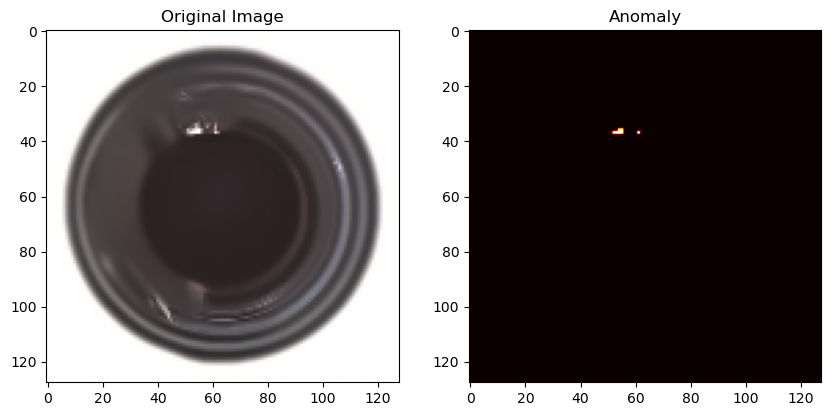

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


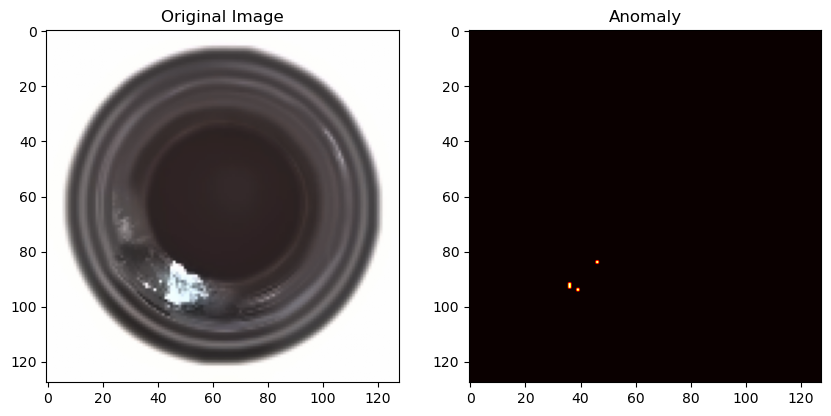

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


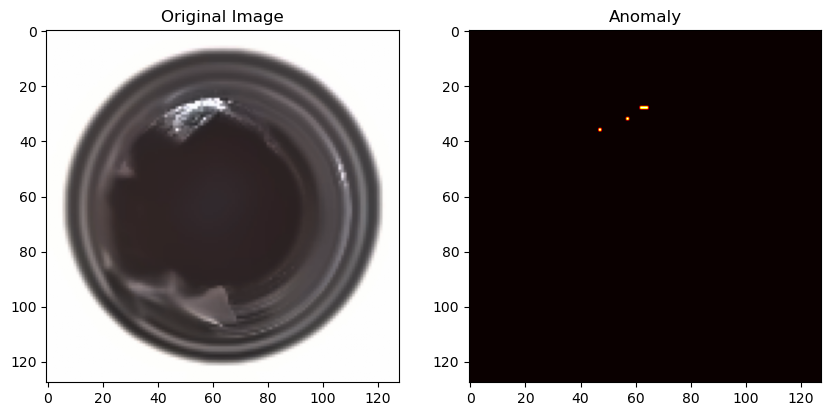

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


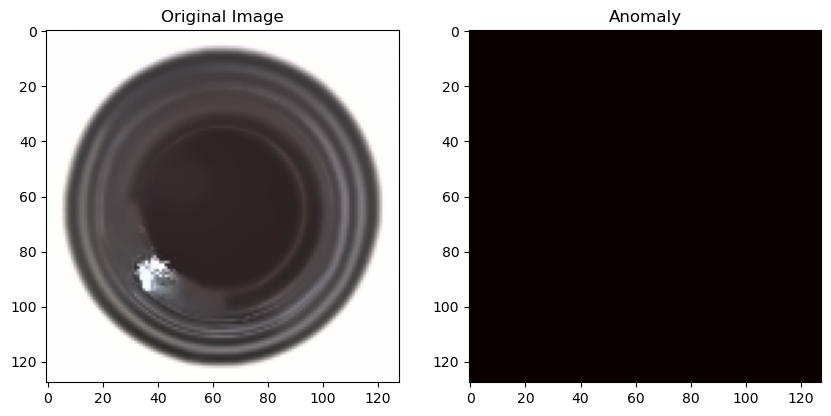

Is the new image defective? False
1/1 [==============================] - 0s 36ms/step


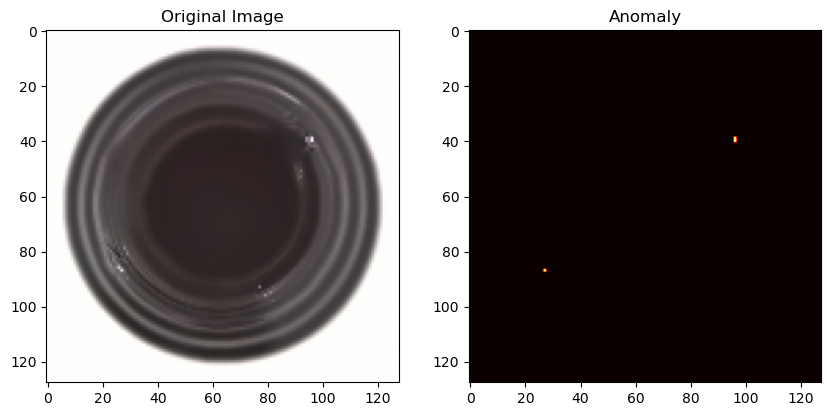

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


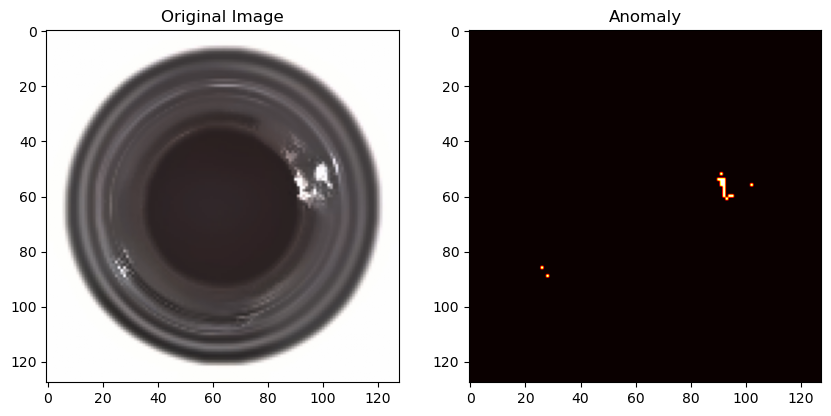

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


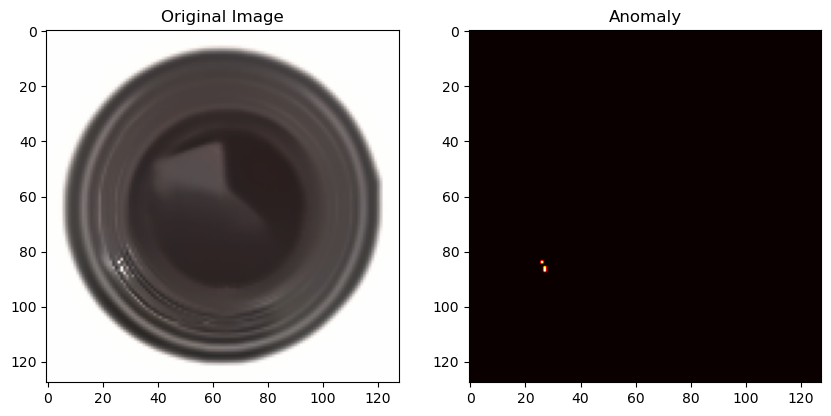

Is the new image defective? True
1/1 [==============================] - 0s 29ms/step


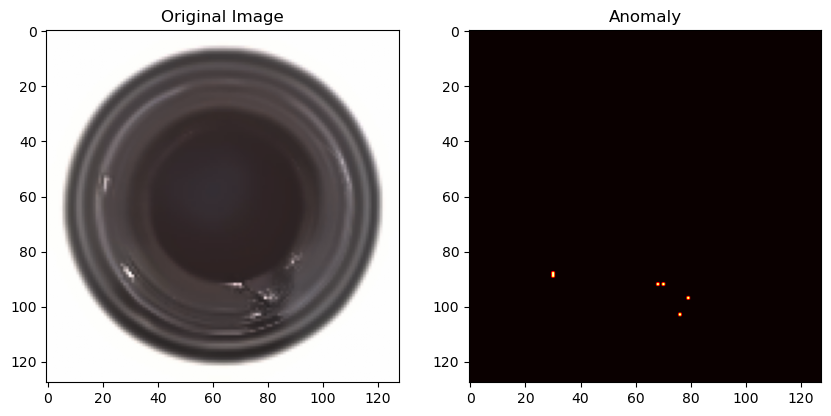

Is the new image defective? True
1/1 [==============================] - 0s 28ms/step


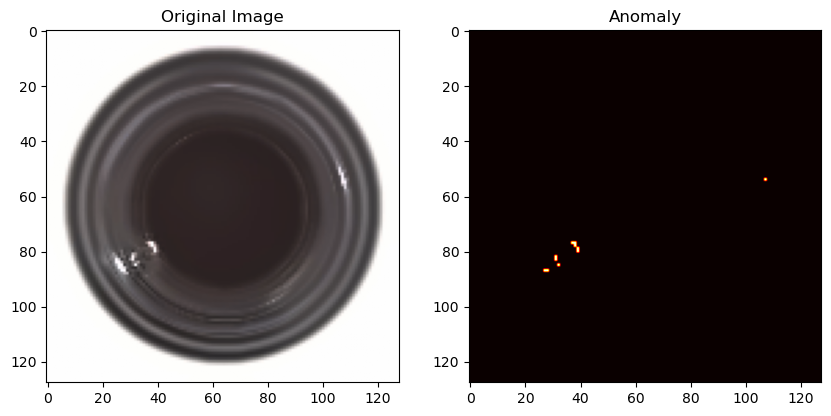

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


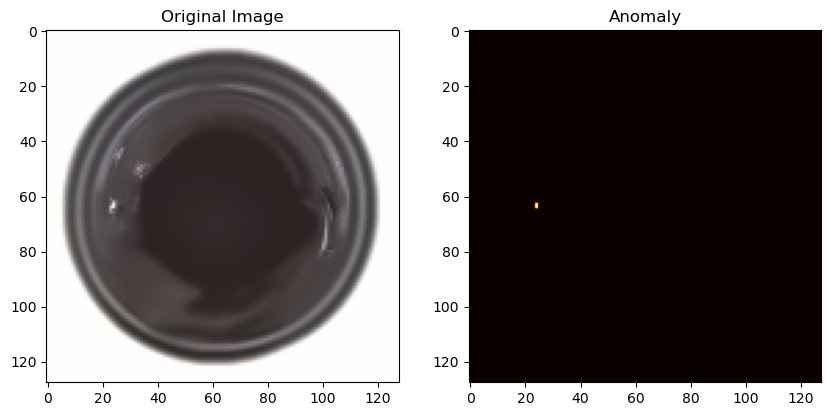

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


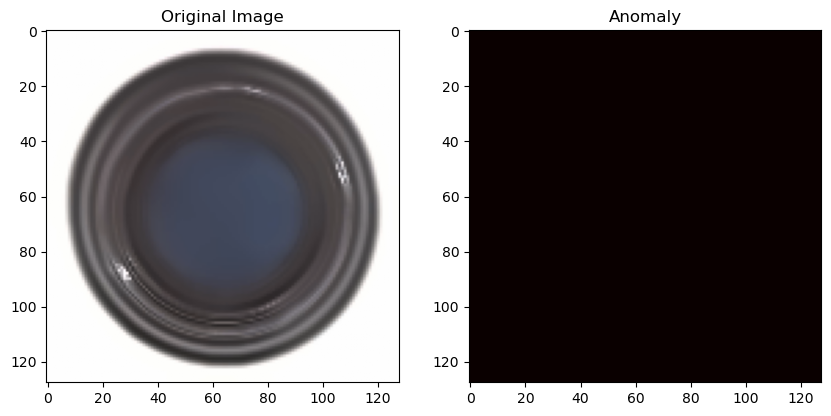

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


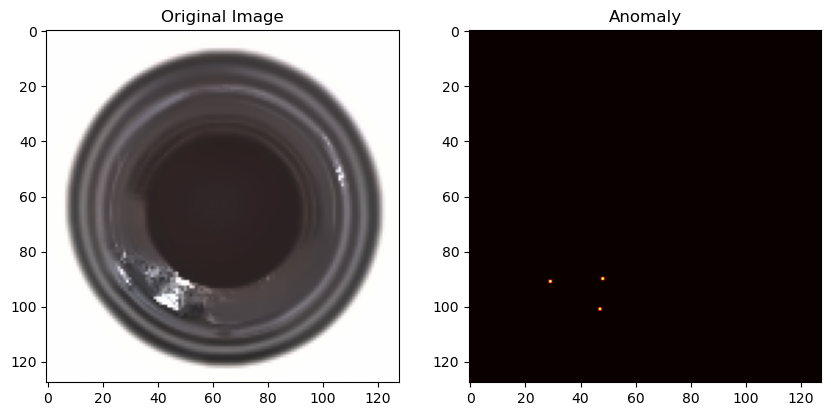

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


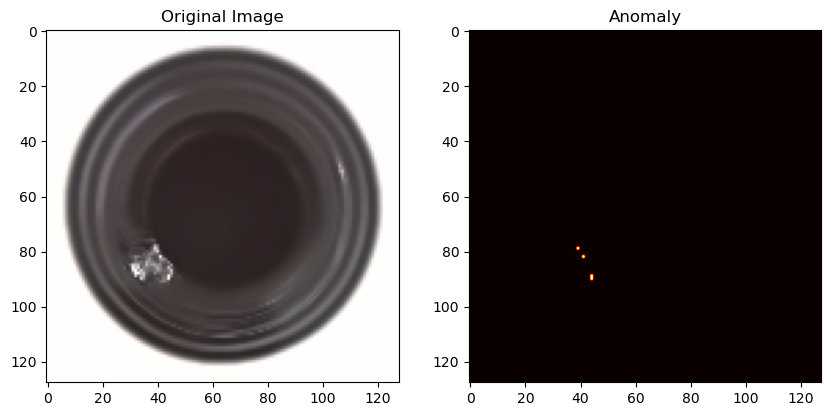

Is the new image defective? True


In [38]:
for ig in x_test[y_test==0]:
    is_defective = detect_defect(ig)
    print("Is the new image defective?", is_defective)

test on non-defective bottle

1/1 [==============================] - 0s 22ms/step


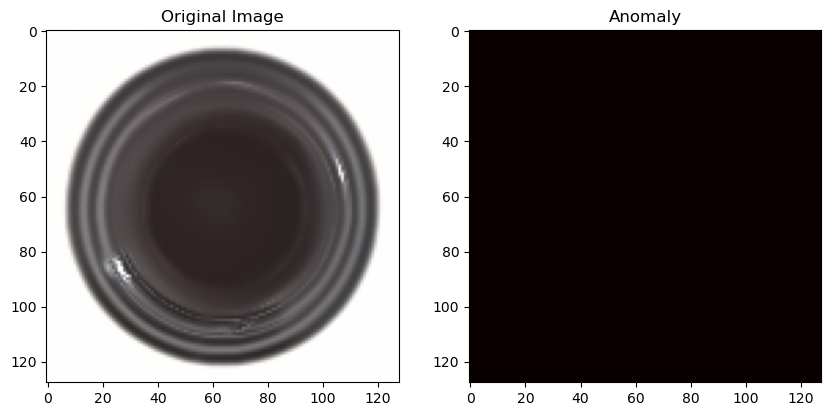

Is the new image defective? False
1/1 [==============================] - 0s 25ms/step


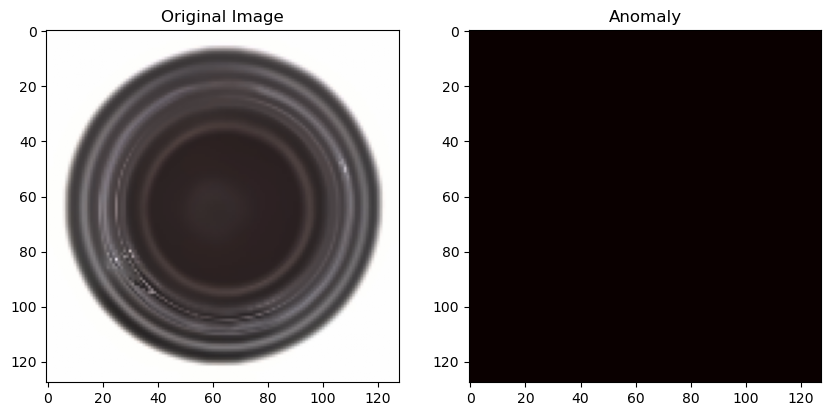

Is the new image defective? False
1/1 [==============================] - 0s 32ms/step


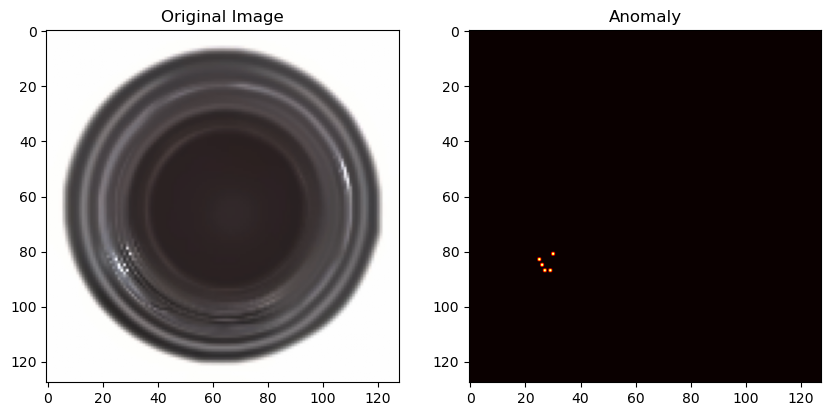

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


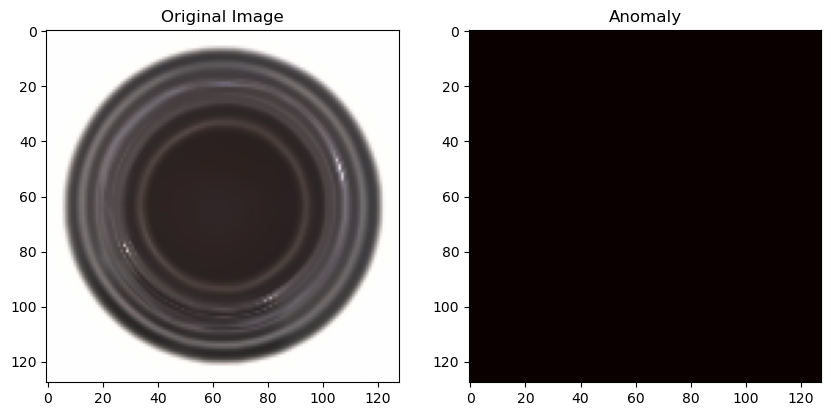

Is the new image defective? False
1/1 [==============================] - 0s 32ms/step


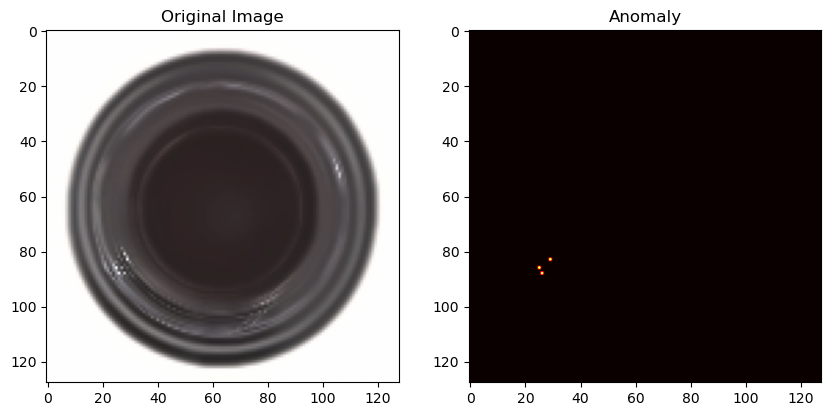

Is the new image defective? True
1/1 [==============================] - 0s 36ms/step


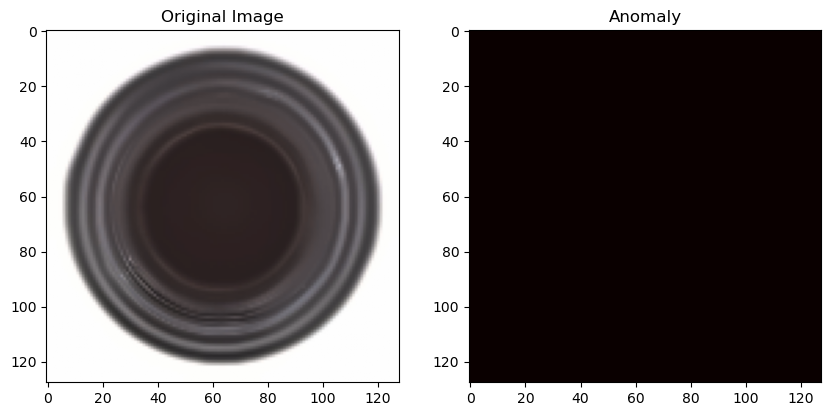

Is the new image defective? False
1/1 [==============================] - 0s 34ms/step


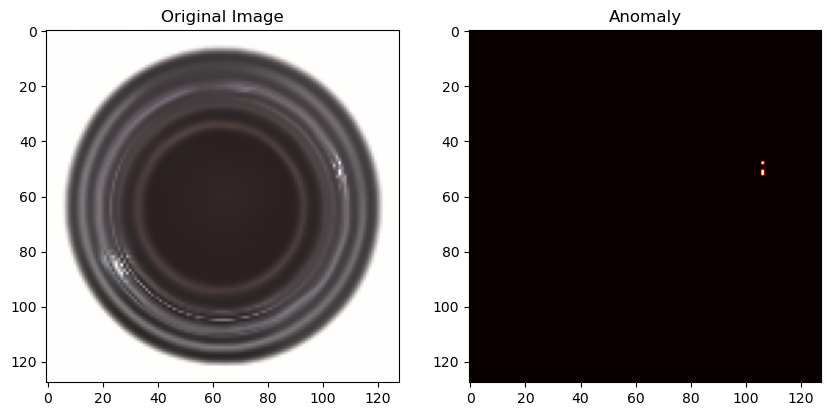

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


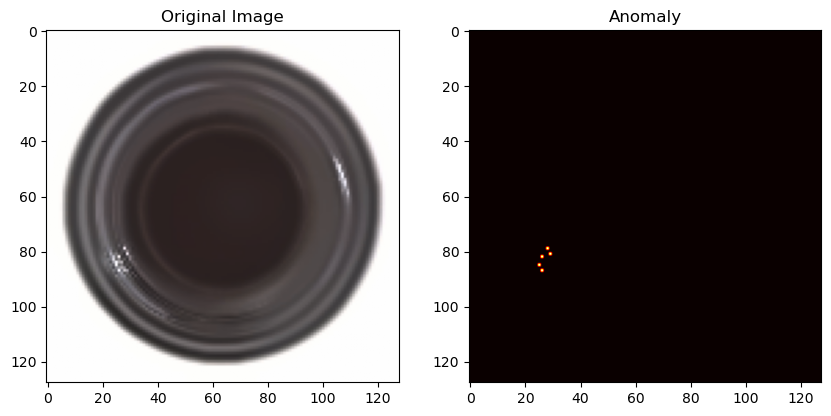

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


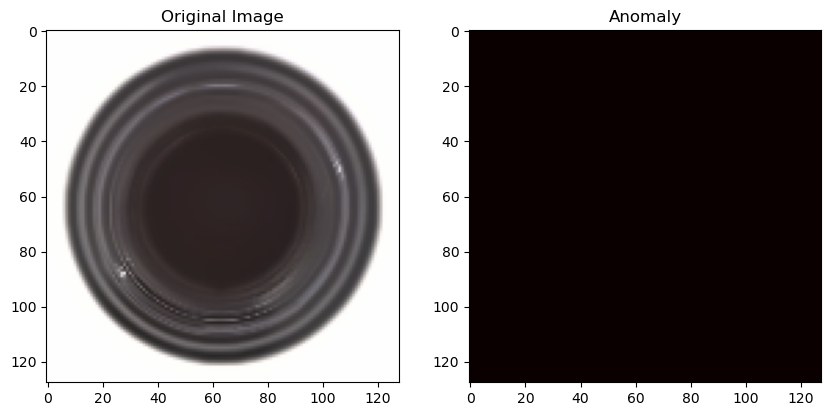

Is the new image defective? False
1/1 [==============================] - 0s 23ms/step


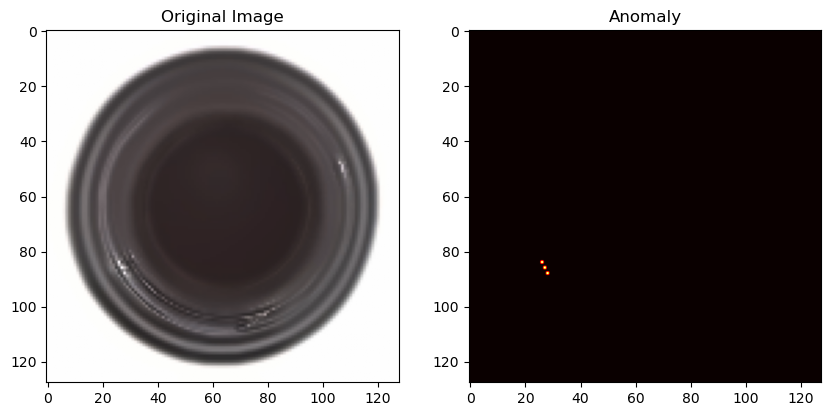

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


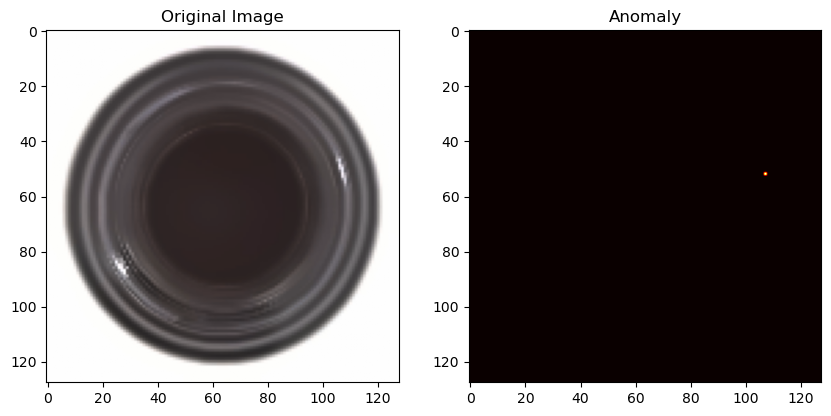

Is the new image defective? True
1/1 [==============================] - 0s 27ms/step


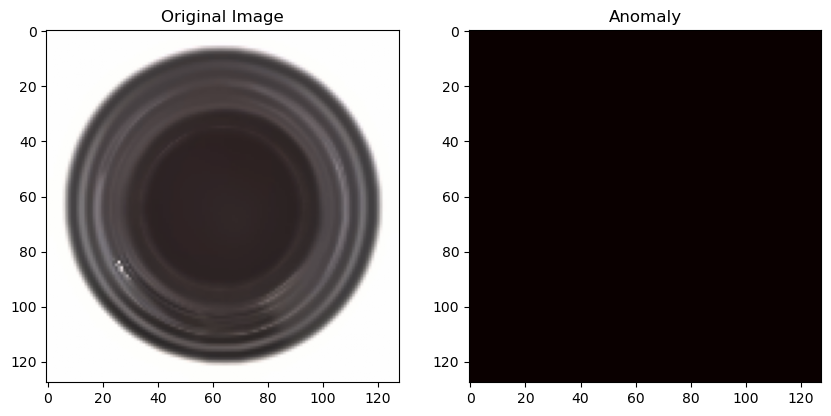

Is the new image defective? False
1/1 [==============================] - 0s 25ms/step


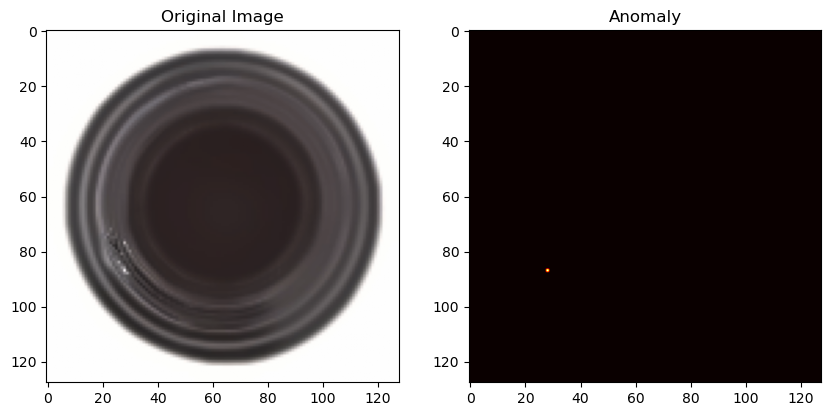

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


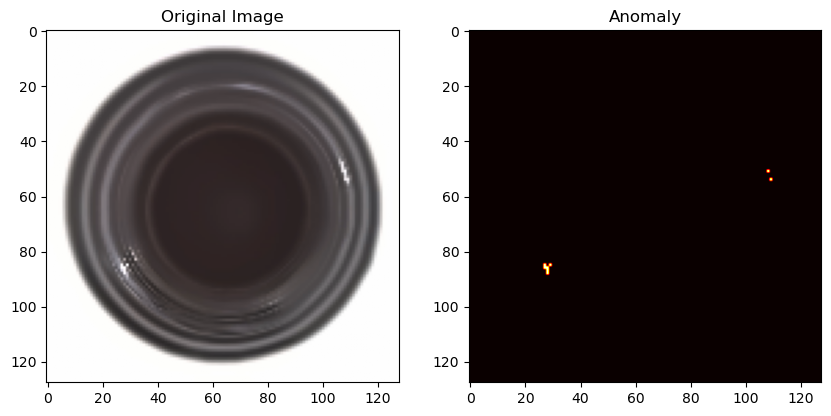

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


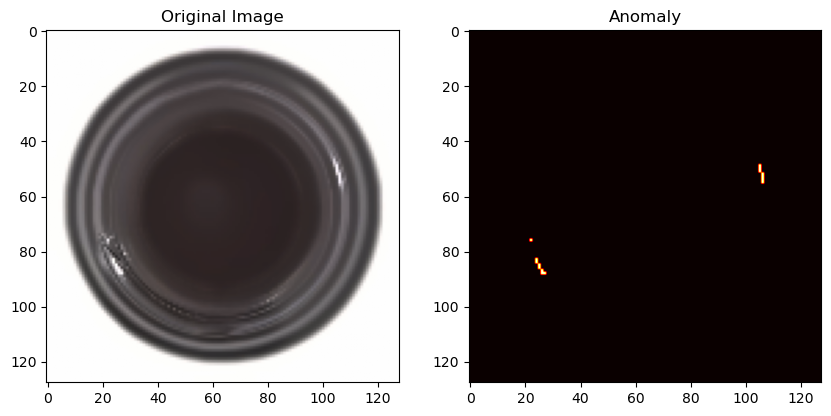

Is the new image defective? True
1/1 [==============================] - 0s 27ms/step


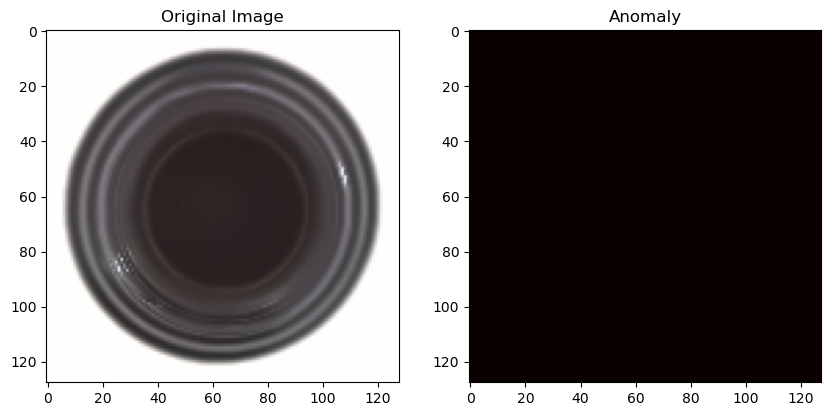

Is the new image defective? False
1/1 [==============================] - 0s 24ms/step


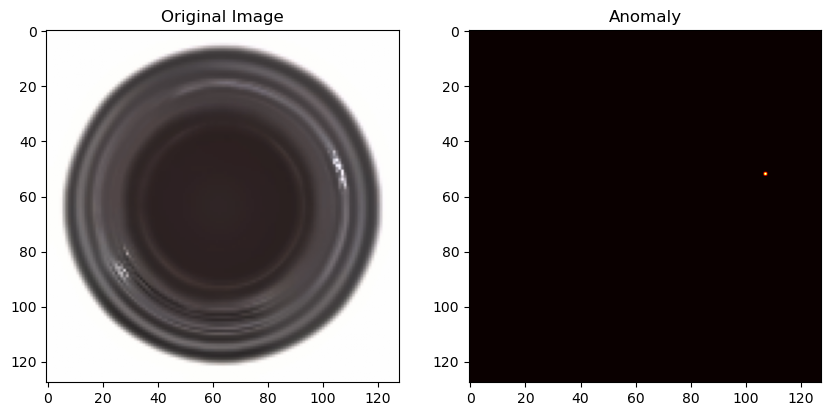

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


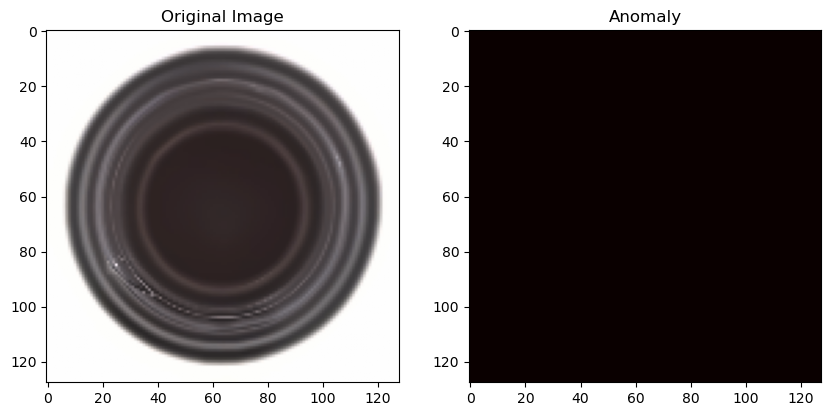

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


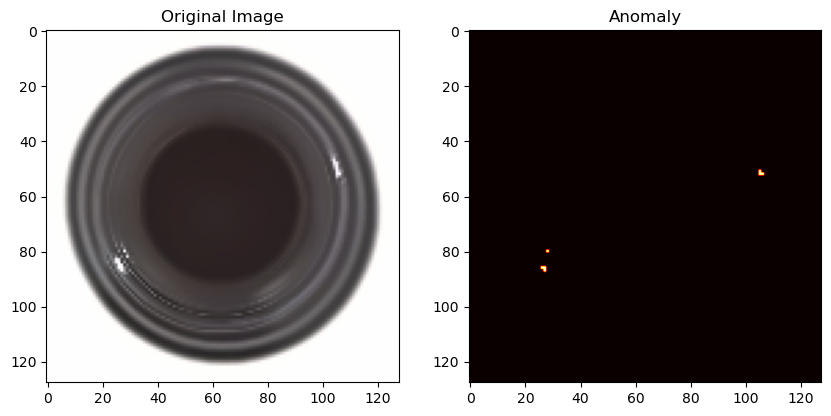

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


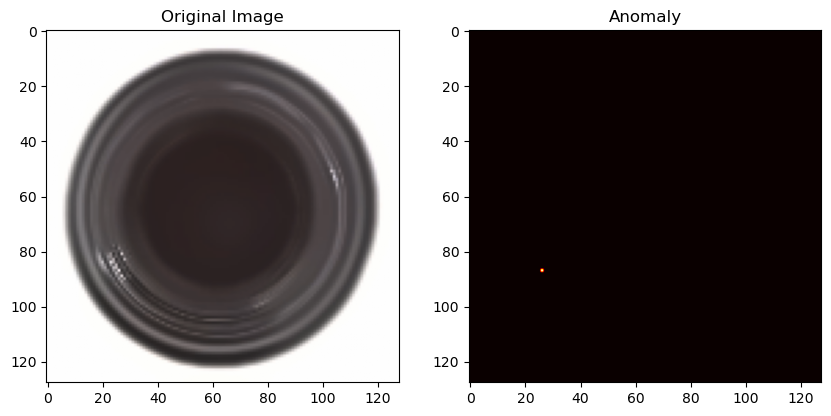

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


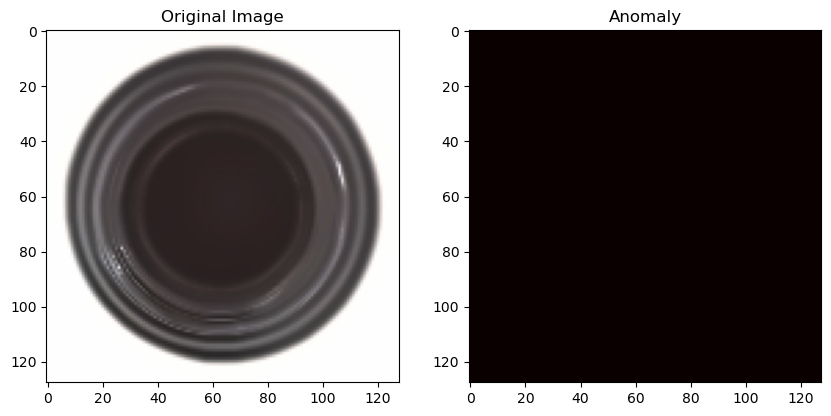

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


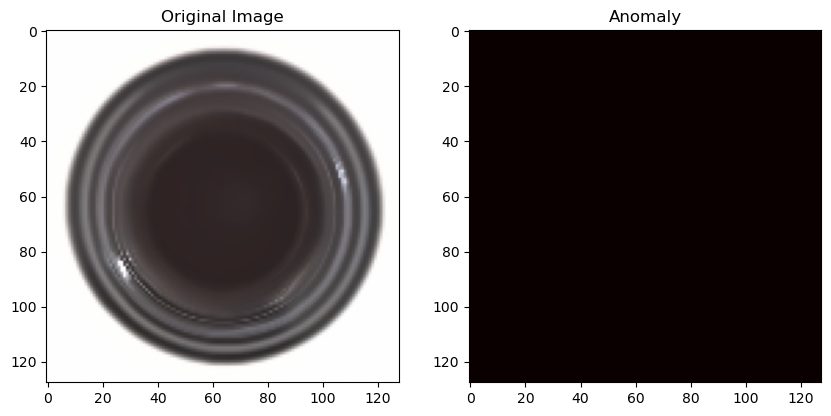

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


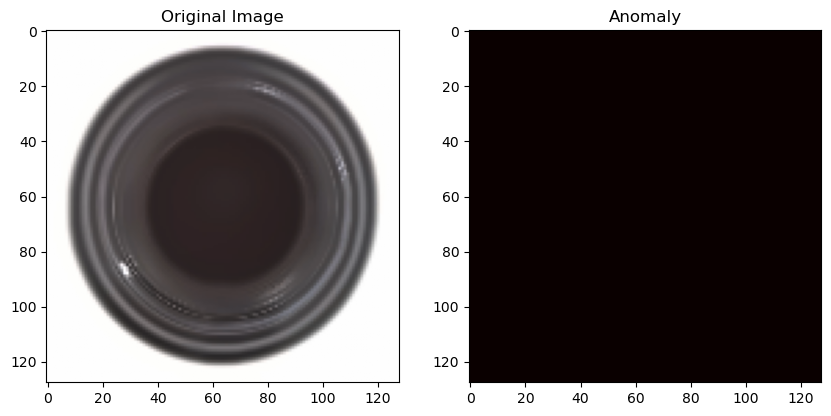

Is the new image defective? False
1/1 [==============================] - 0s 23ms/step


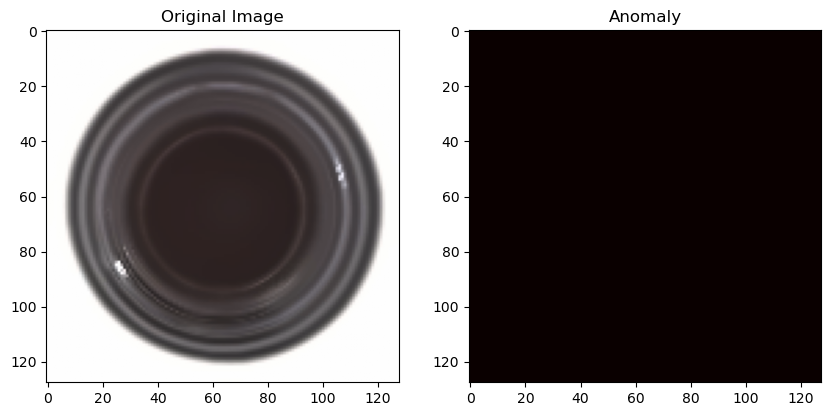

Is the new image defective? False
1/1 [==============================] - 0s 20ms/step


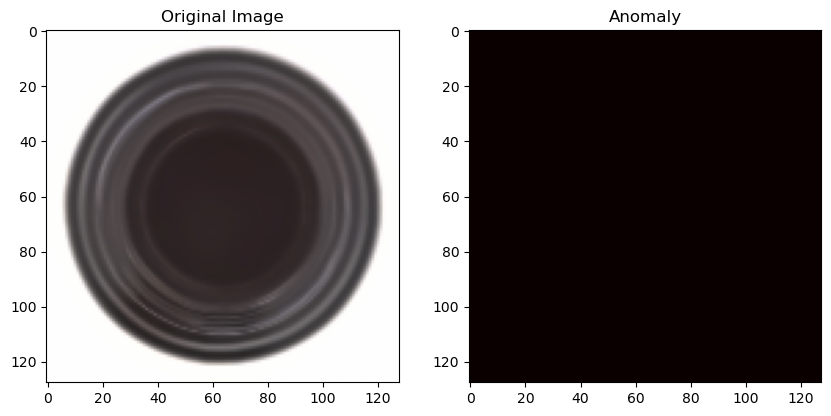

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


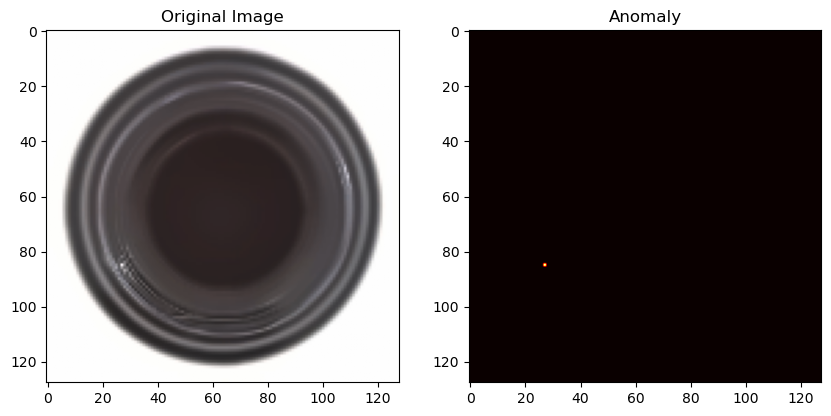

Is the new image defective? True
1/1 [==============================] - 0s 26ms/step


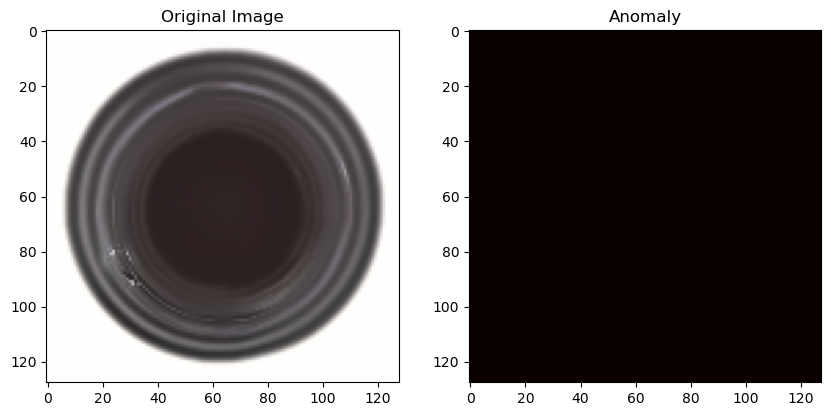

Is the new image defective? False
1/1 [==============================] - 0s 26ms/step


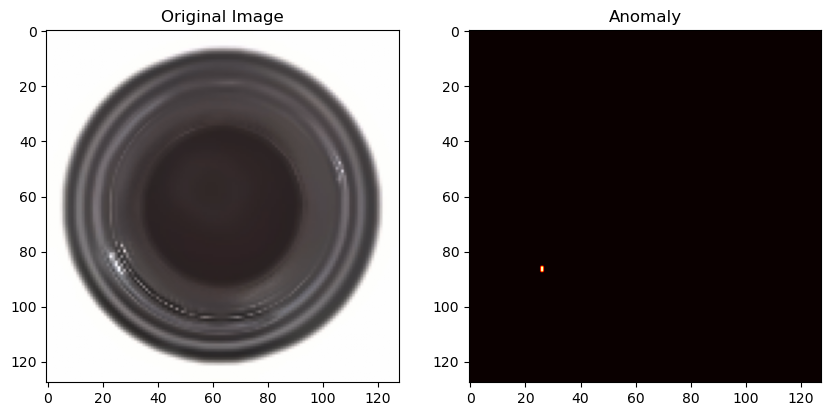

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


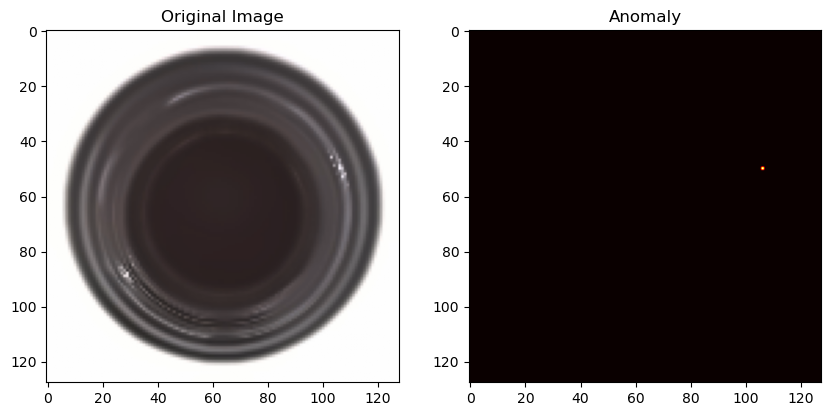

Is the new image defective? True
1/1 [==============================] - 0s 26ms/step


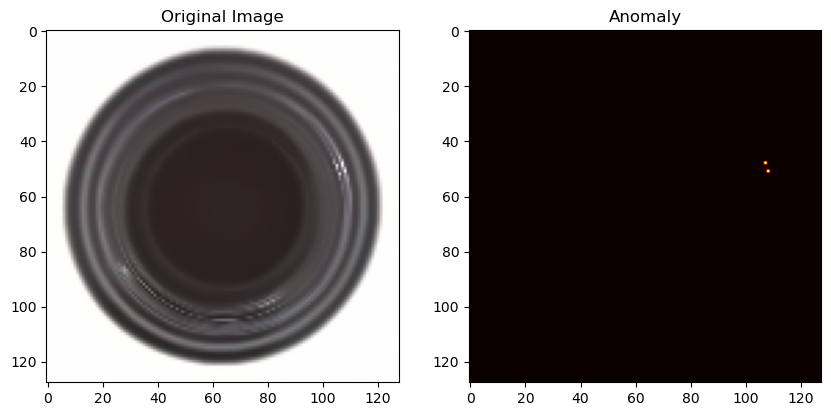

Is the new image defective? True
1/1 [==============================] - 0s 29ms/step


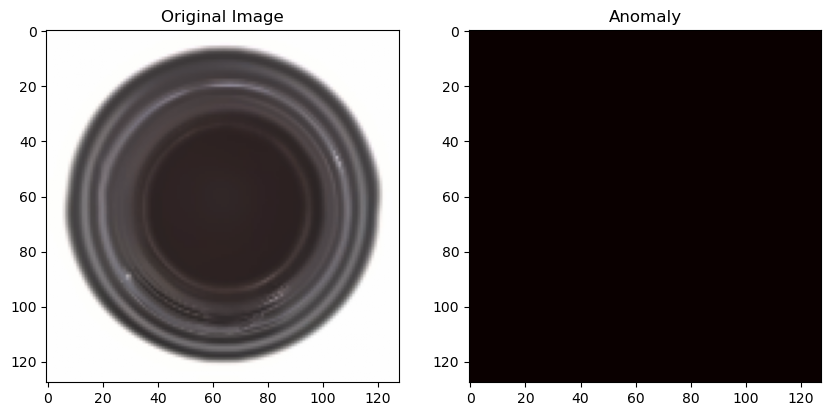

Is the new image defective? False
1/1 [==============================] - 0s 25ms/step


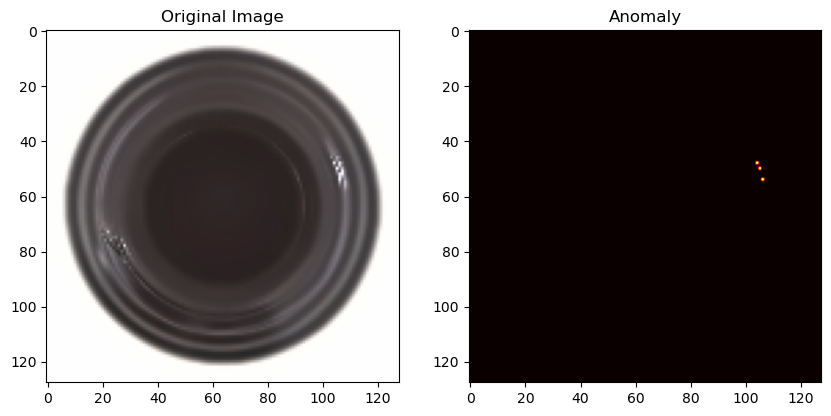

Is the new image defective? True
1/1 [==============================] - 0s 32ms/step


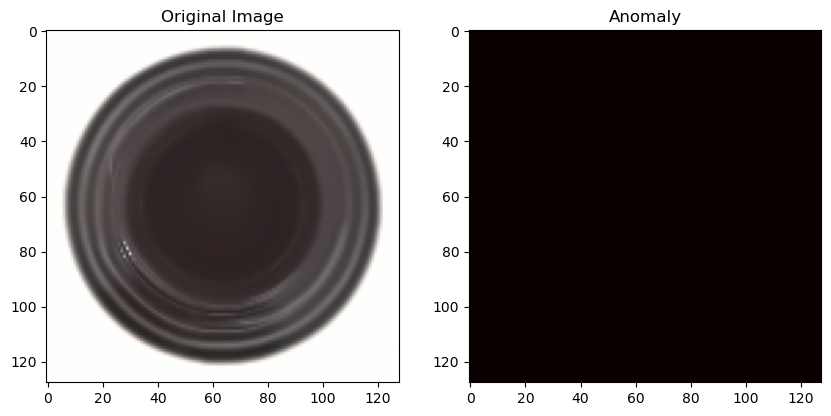

Is the new image defective? False
1/1 [==============================] - 0s 20ms/step


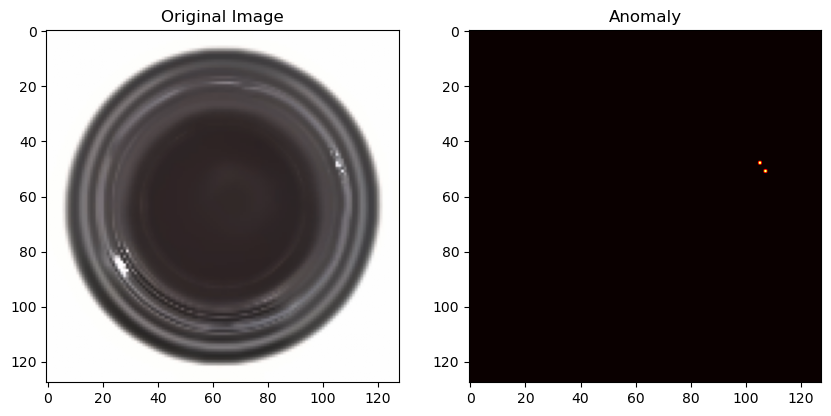

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


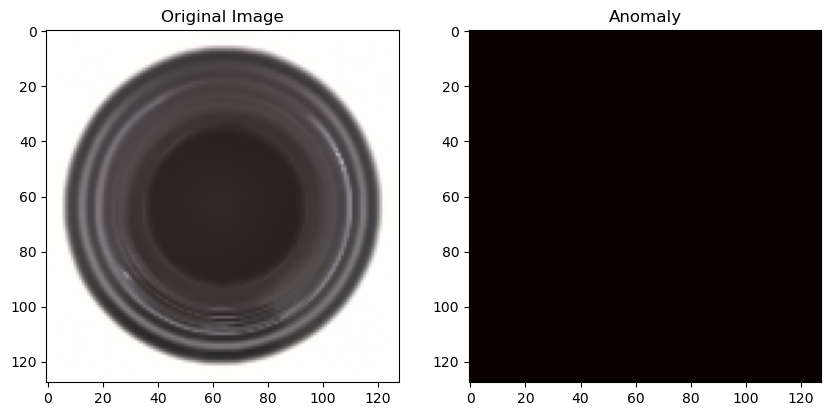

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


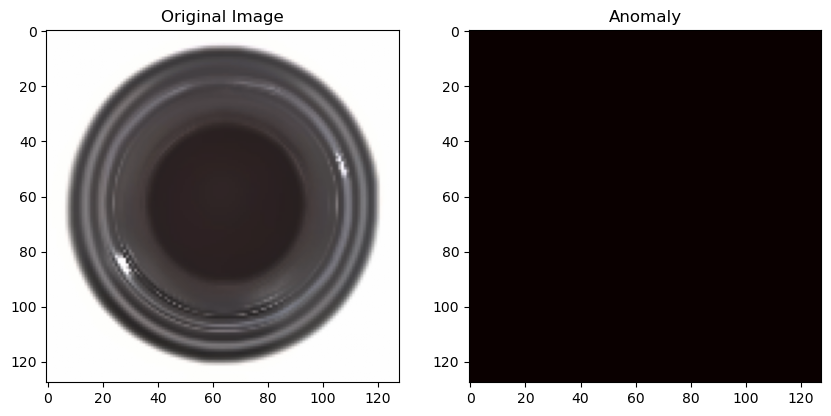

Is the new image defective? False
1/1 [==============================] - 0s 34ms/step


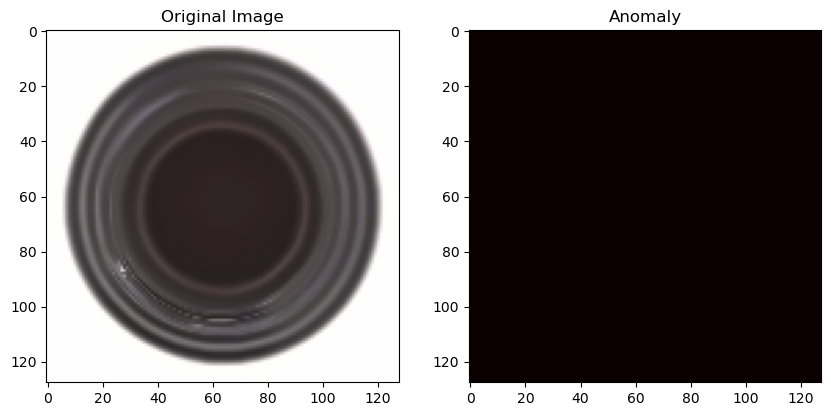

Is the new image defective? False
1/1 [==============================] - 0s 30ms/step


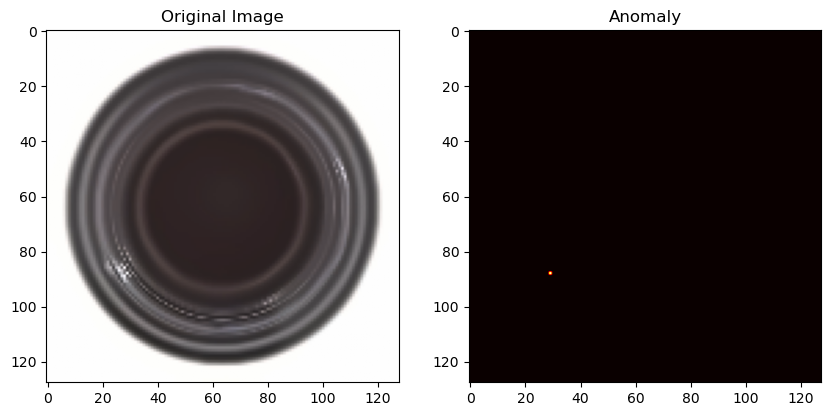

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


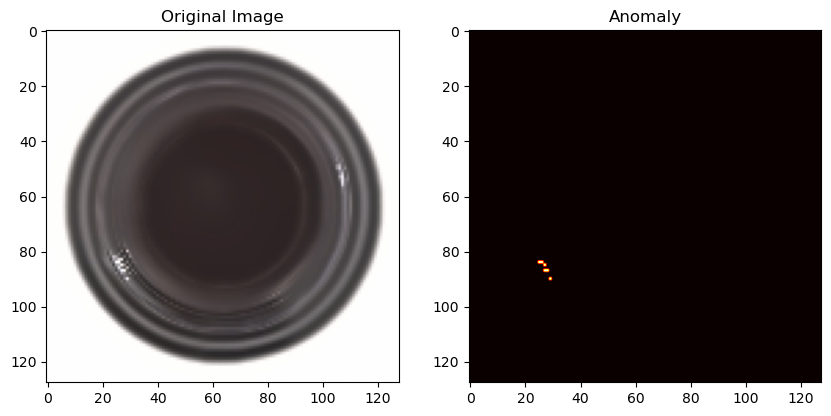

Is the new image defective? True
1/1 [==============================] - 0s 27ms/step


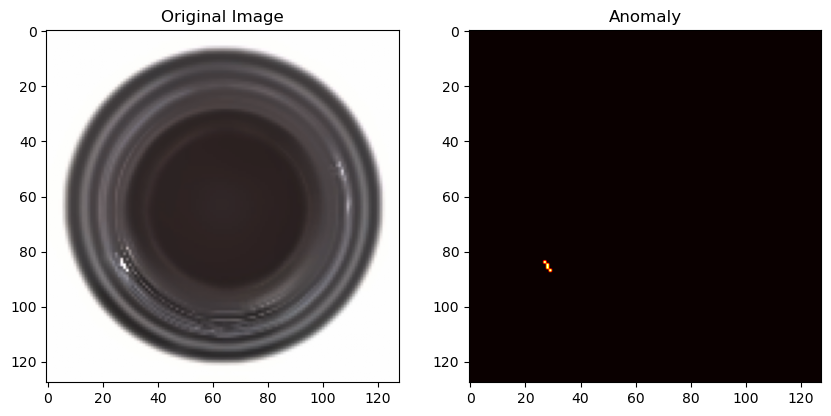

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


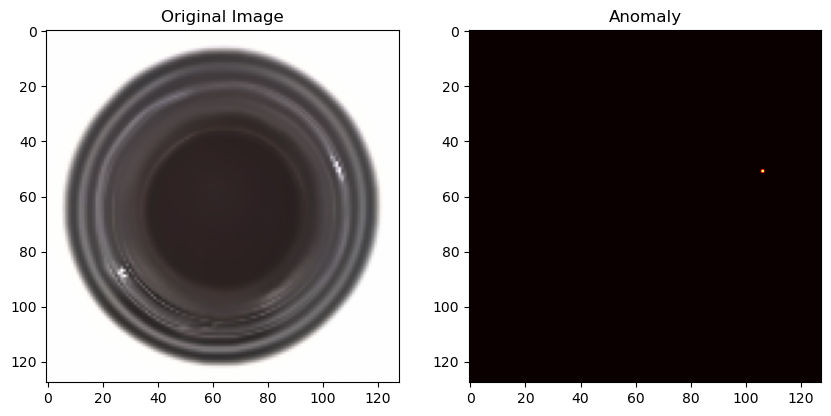

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


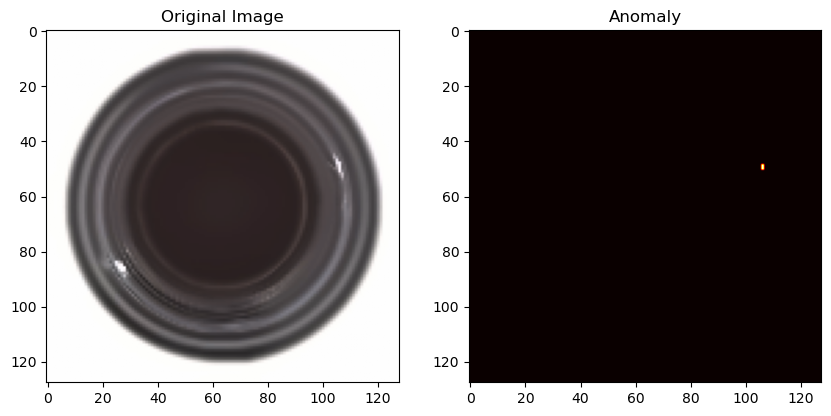

Is the new image defective? True
1/1 [==============================] - 0s 31ms/step


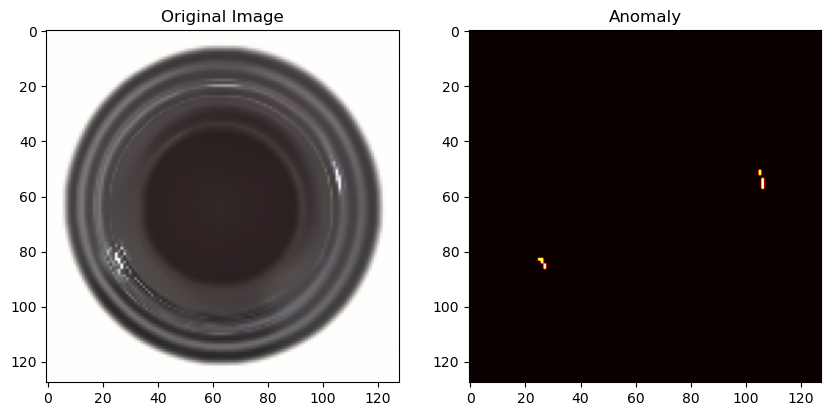

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


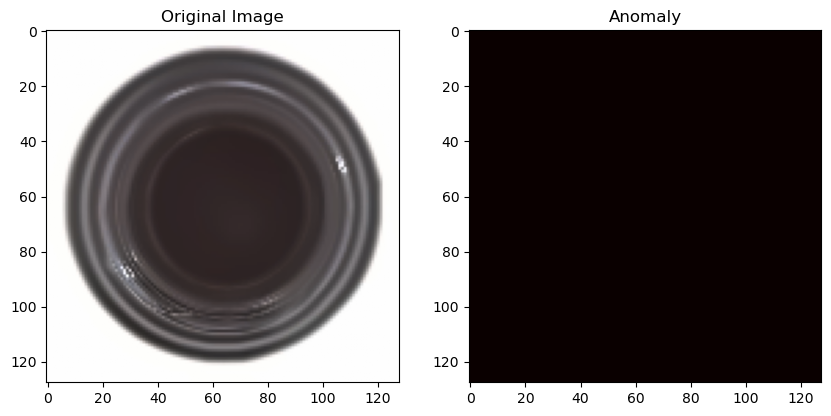

Is the new image defective? False
1/1 [==============================] - 0s 23ms/step


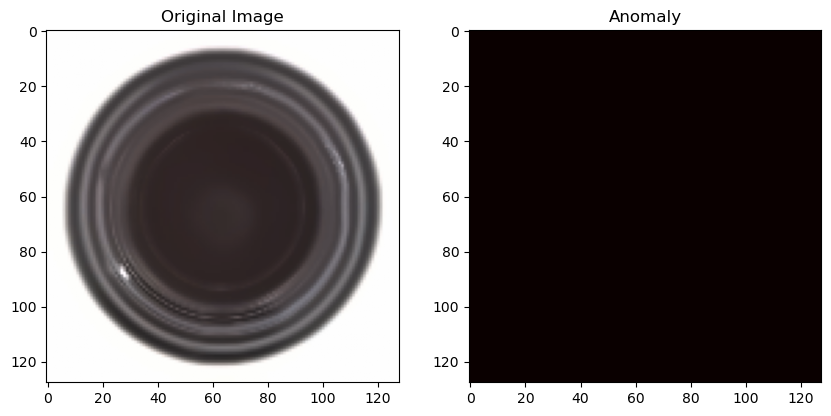

Is the new image defective? False
1/1 [==============================] - 0s 24ms/step


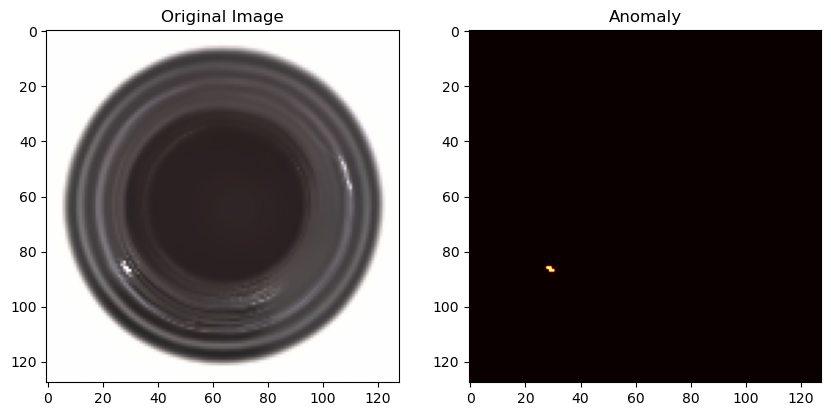

Is the new image defective? True


In [39]:
for ig in x_test[y_test==1]:
    is_defective = detect_defect(ig)
    print("Is the new image defective?", is_defective)

Train on zipper images

In [40]:
x_train_zipper = x_train[(y_train==29)]
autoencoder.fit(x_train_zipper, x_train_zipper, epochs=12, batch_size=44, shuffle=True)

Epoch 1/12
5/5 [==============================] - 3s 470ms/step - loss: 0.6898
Epoch 2/12
5/5 [==============================] - 2s 496ms/step - loss: 0.6674
Epoch 3/12
5/5 [==============================] - 3s 493ms/step - loss: 0.6044
Epoch 4/12
5/5 [==============================] - 2s 481ms/step - loss: 0.4985
Epoch 5/12
5/5 [==============================] - 2s 479ms/step - loss: 0.4602
Epoch 6/12
5/5 [==============================] - 2s 501ms/step - loss: 0.4486
Epoch 7/12
5/5 [==============================] - 2s 490ms/step - loss: 0.4435
Epoch 8/12
5/5 [==============================] - 2s 477ms/step - loss: 0.4378
Epoch 9/12
5/5 [==============================] - 3s 515ms/step - loss: 0.4354
Epoch 10/12
5/5 [==============================] - 3s 550ms/step - loss: 0.4336
Epoch 11/12
5/5 [==============================] - 3s 528ms/step - loss: 0.4321
Epoch 12/12
5/5 [==============================] - 3s 524ms/step - loss: 0.4312


1/1 [==============================] - 0s 26ms/step


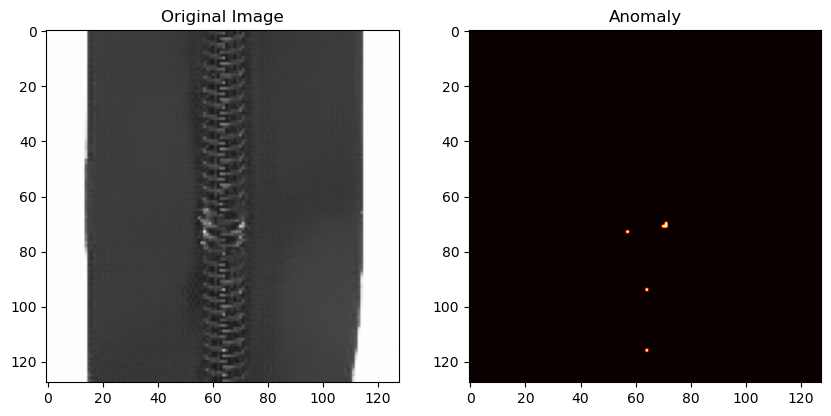

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


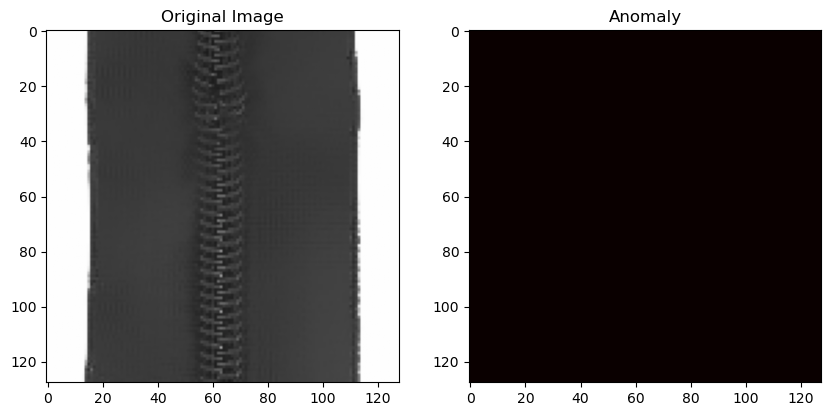

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


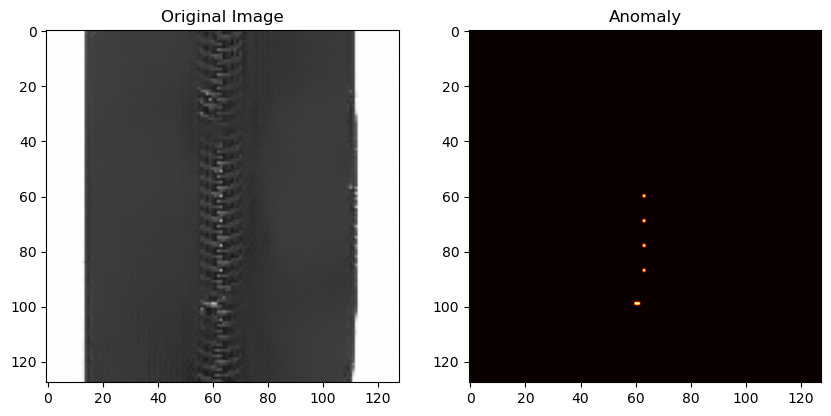

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


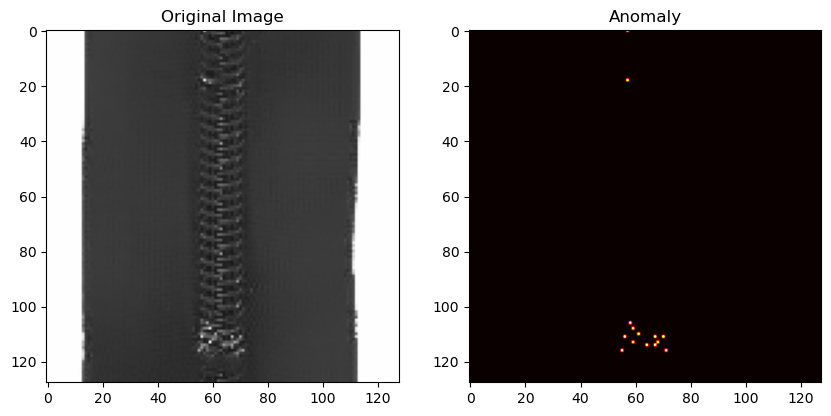

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


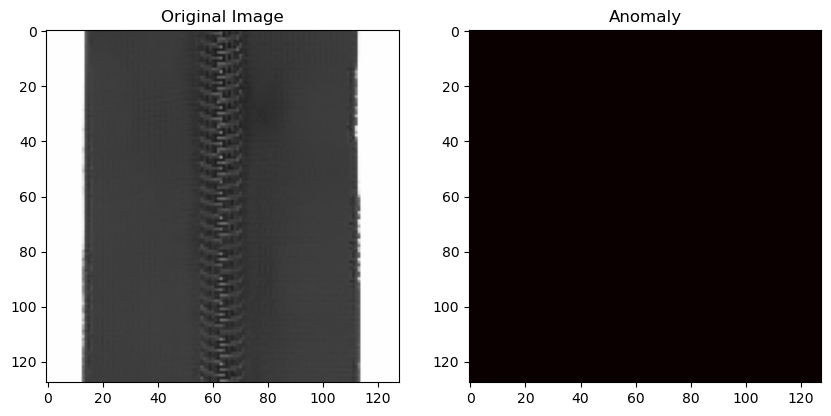

Is the new image defective? False
1/1 [==============================] - 0s 19ms/step


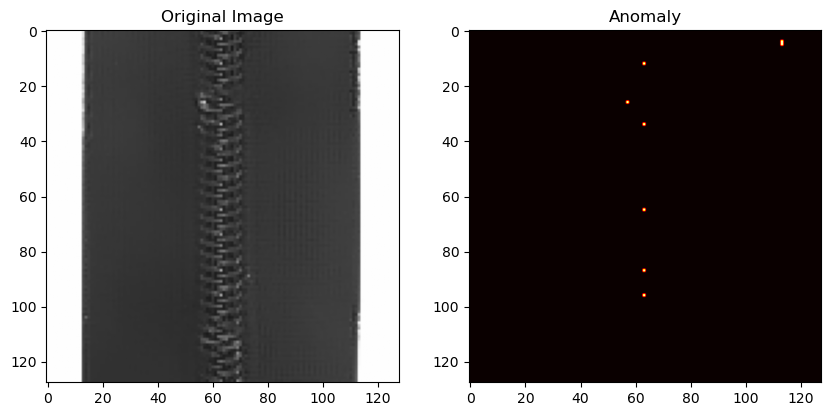

Is the new image defective? True
1/1 [==============================] - 0s 31ms/step


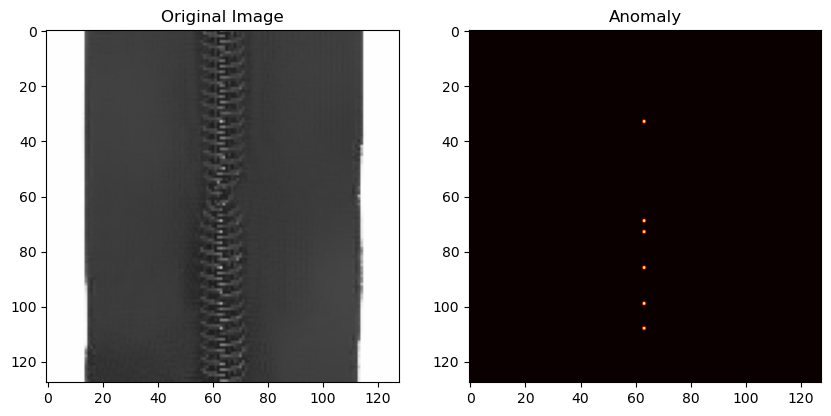

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


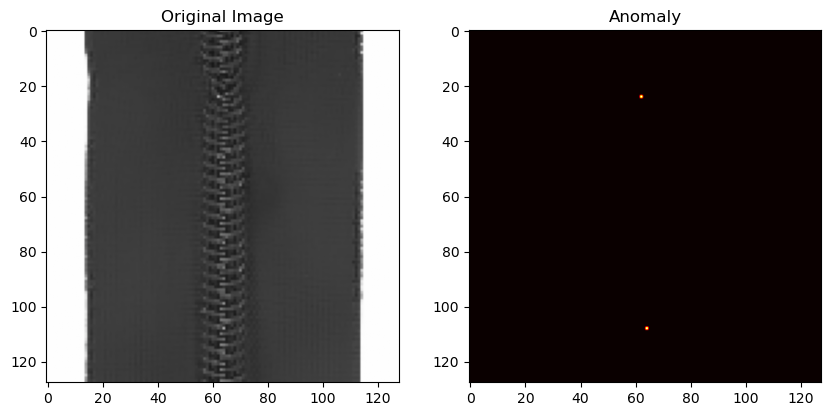

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


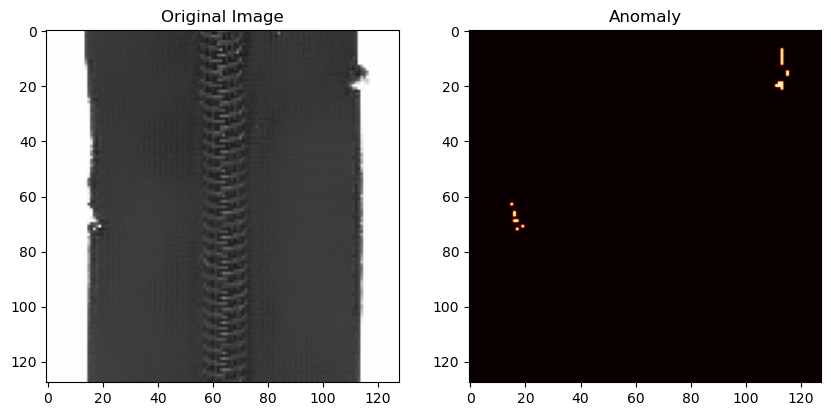

Is the new image defective? True
1/1 [==============================] - 0s 19ms/step


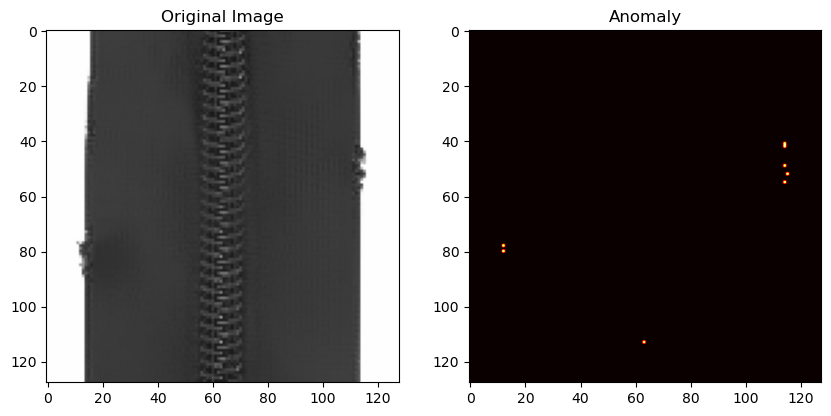

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


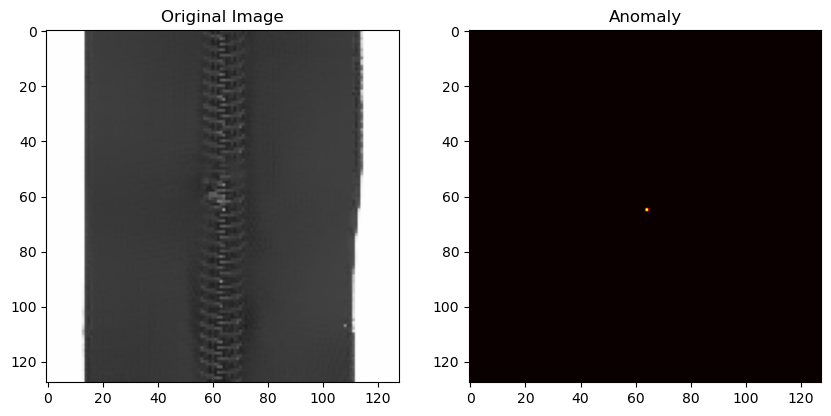

Is the new image defective? True
1/1 [==============================] - 0s 27ms/step


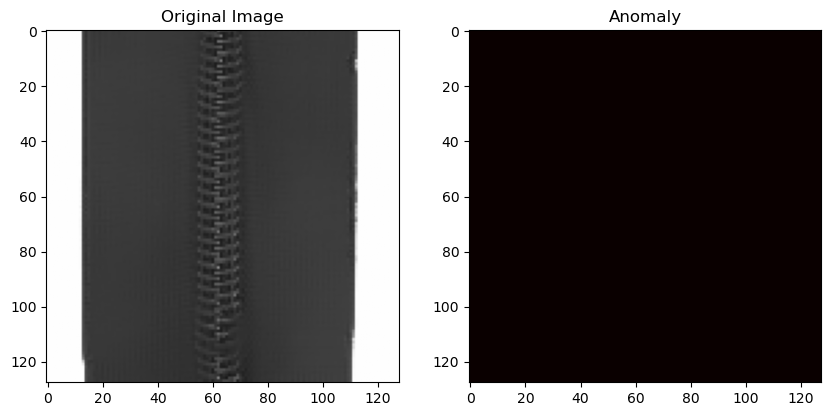

Is the new image defective? False
1/1 [==============================] - 0s 25ms/step


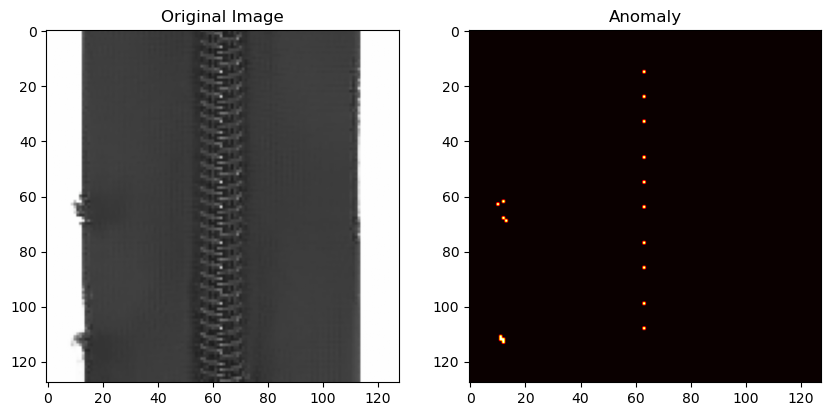

Is the new image defective? True
1/1 [==============================] - 0s 28ms/step


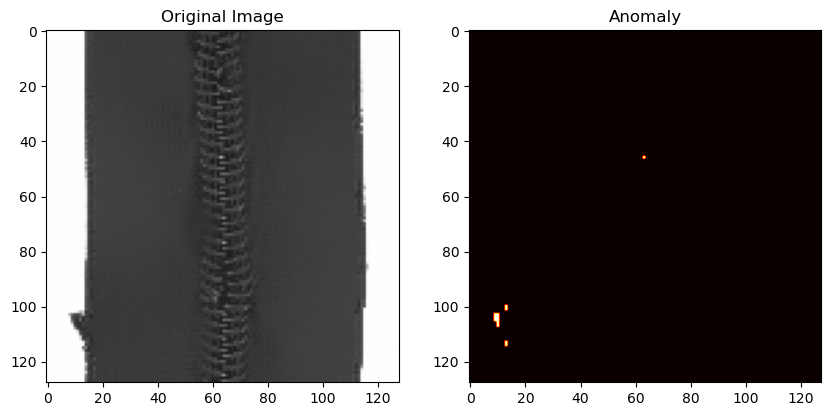

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


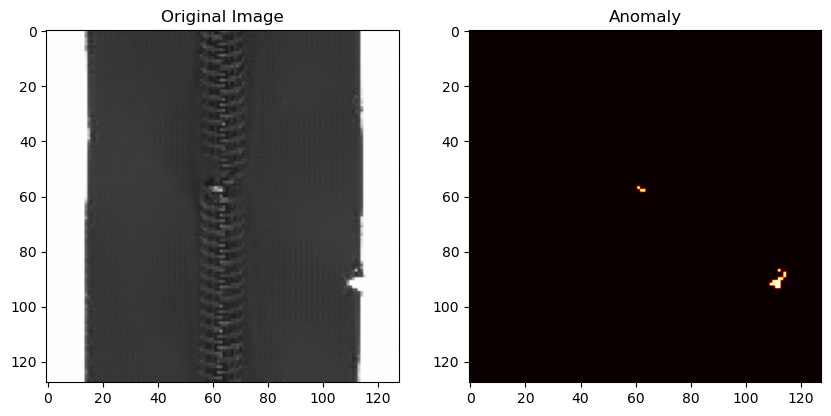

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


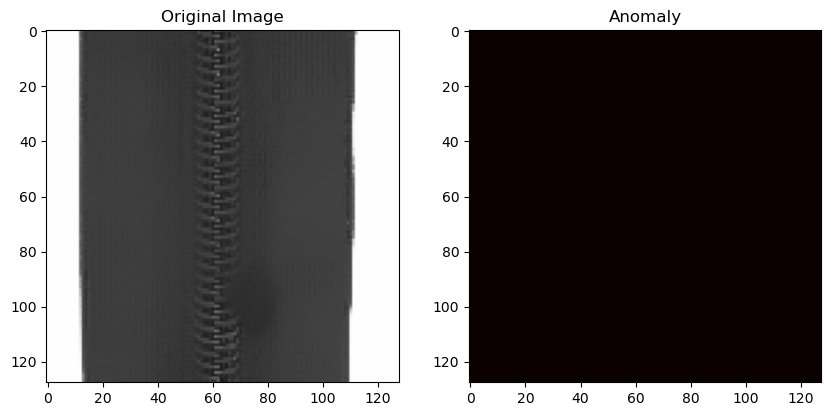

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


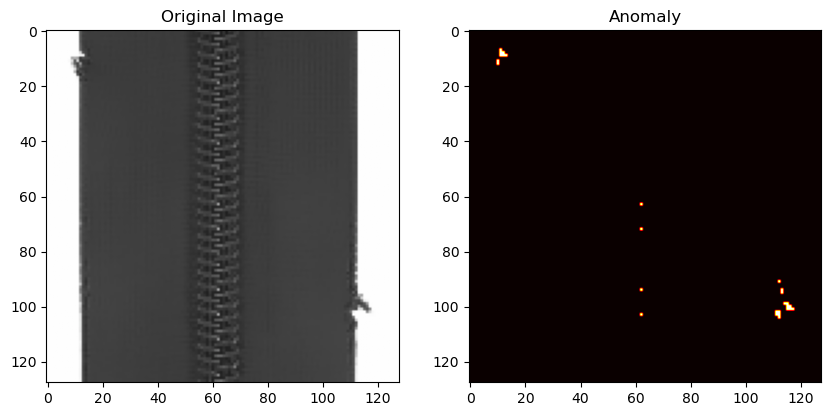

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


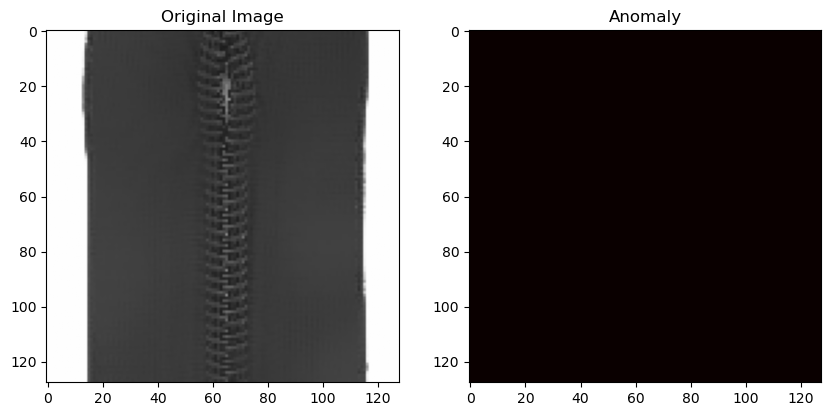

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


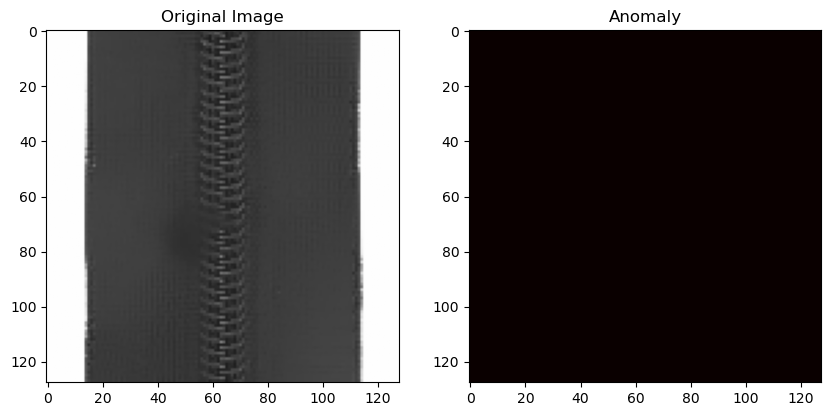

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


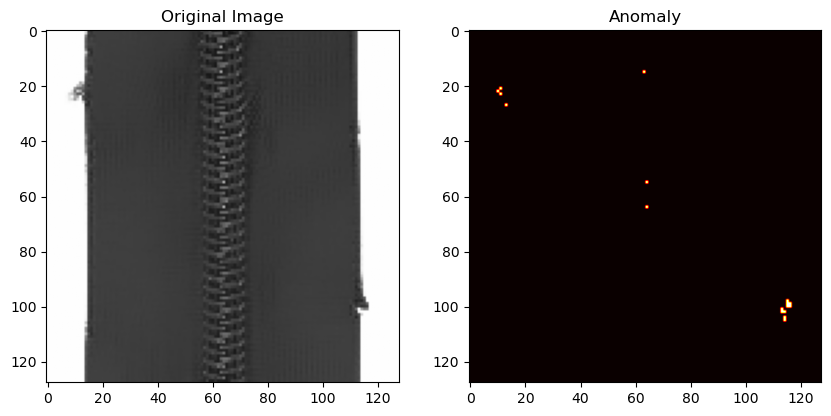

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


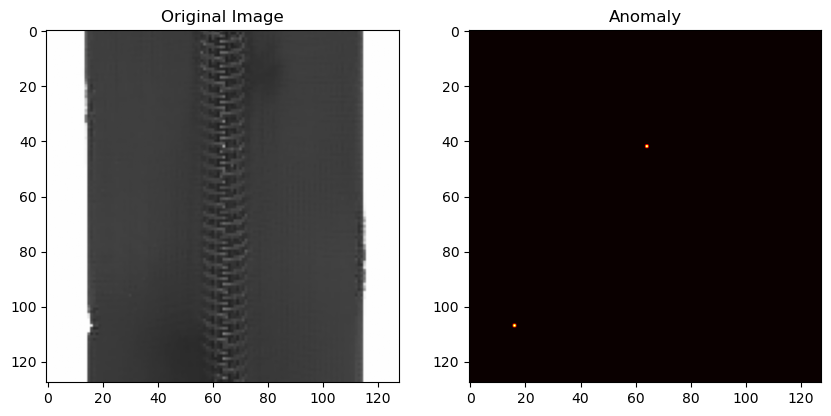

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


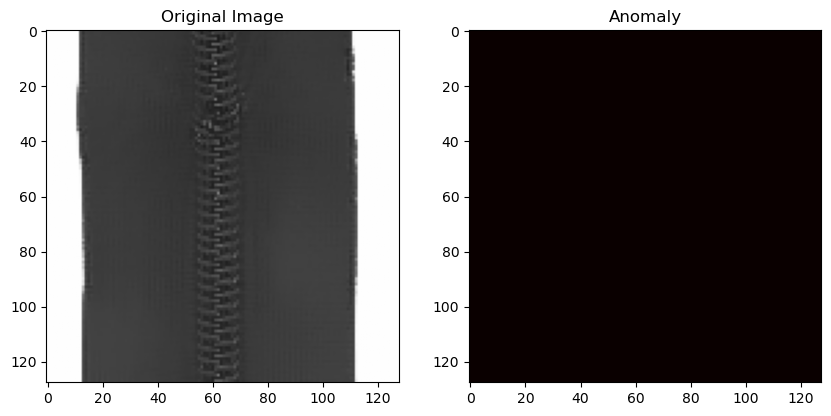

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


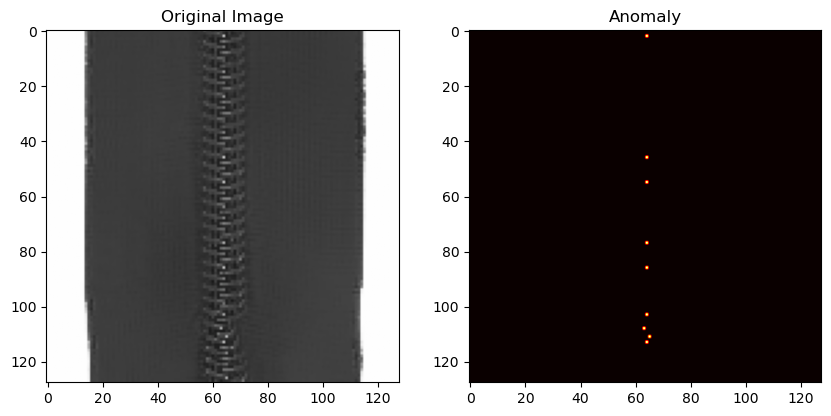

Is the new image defective? True
1/1 [==============================] - 0s 31ms/step


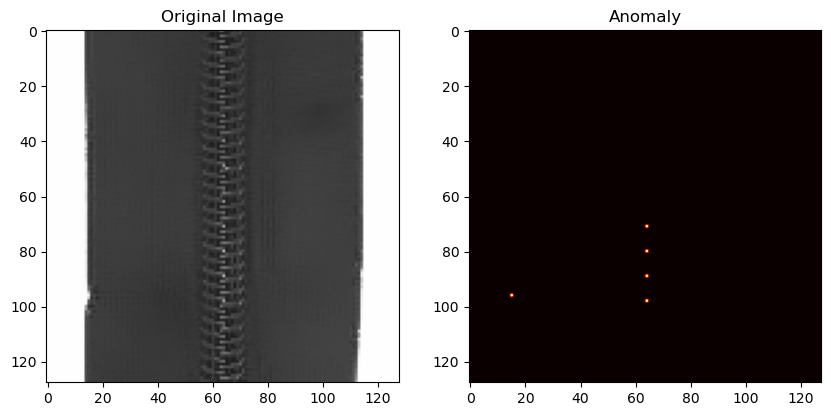

Is the new image defective? True


In [42]:
for ig in x_test[y_test==28]:
    is_defective = detect_defect(ig,0.2)
    print("Is the new image defective?", is_defective)

1/1 [==============================] - 0s 22ms/step


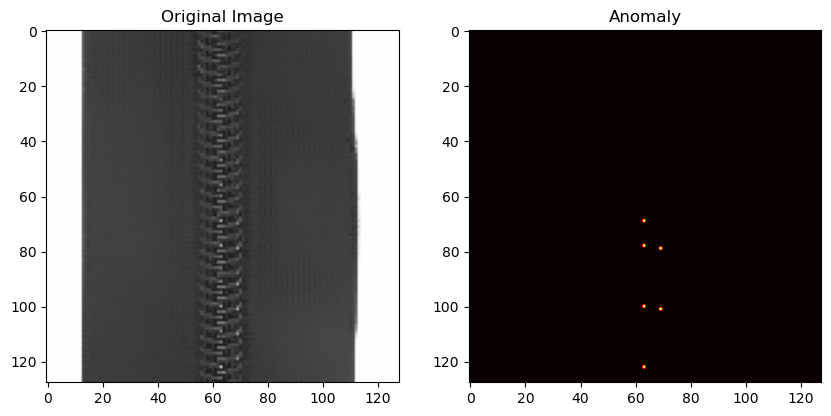

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


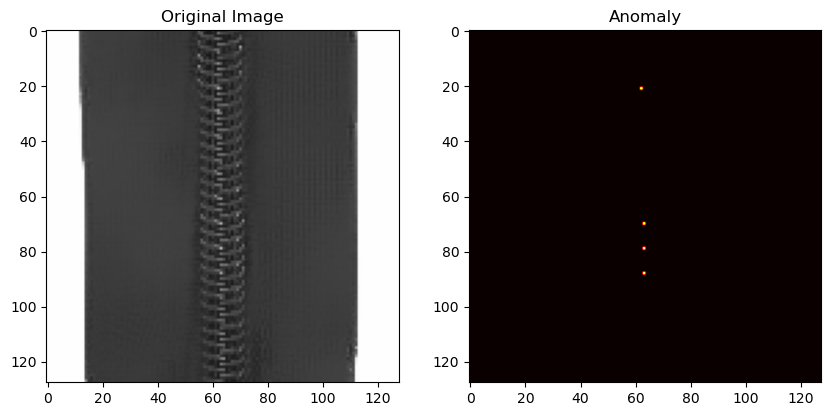

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


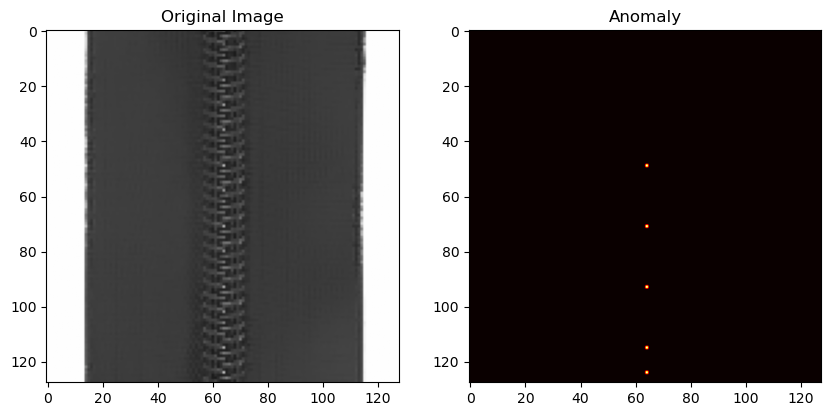

Is the new image defective? True
1/1 [==============================] - 0s 34ms/step


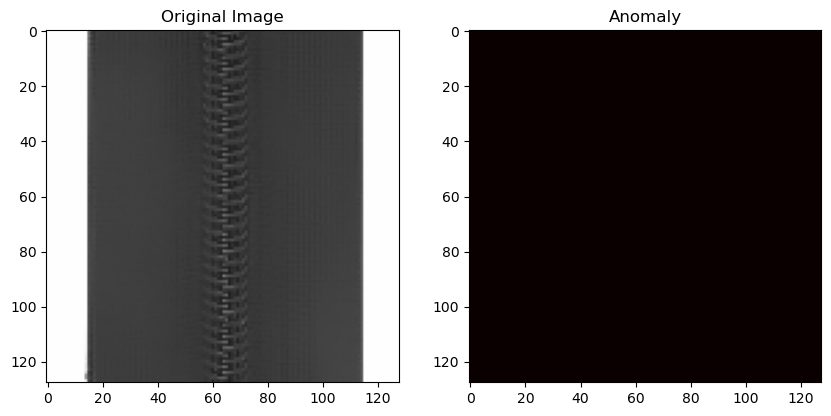

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


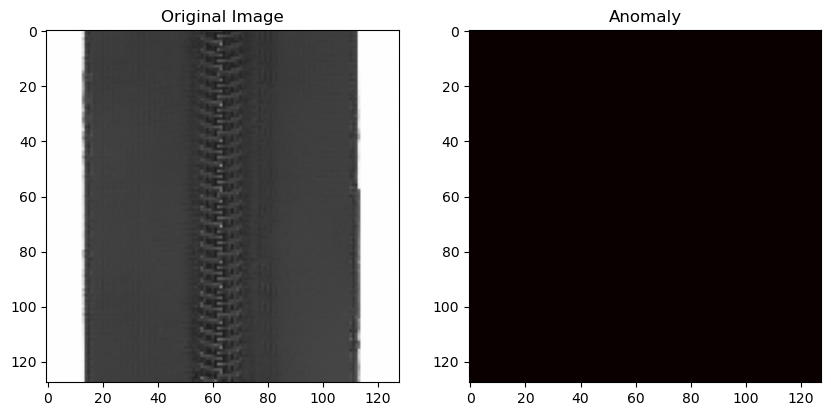

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


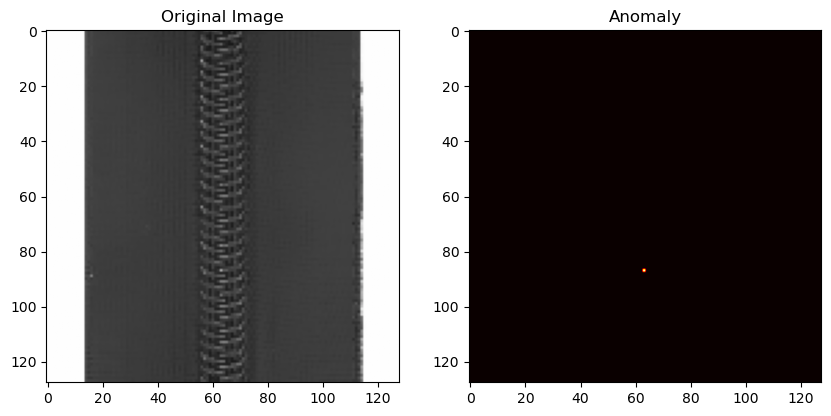

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


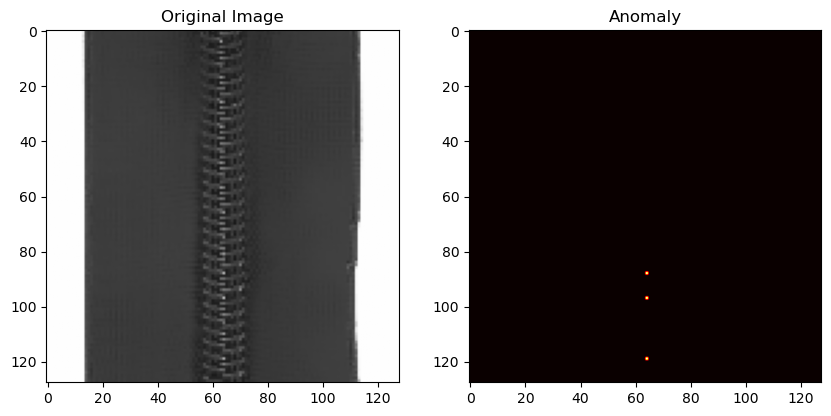

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


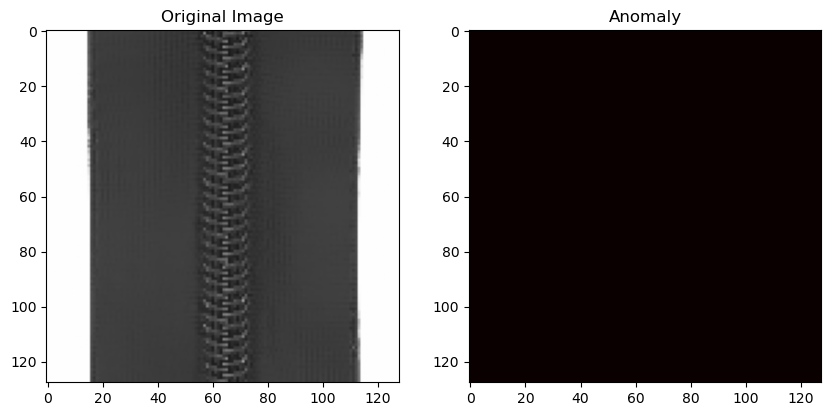

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


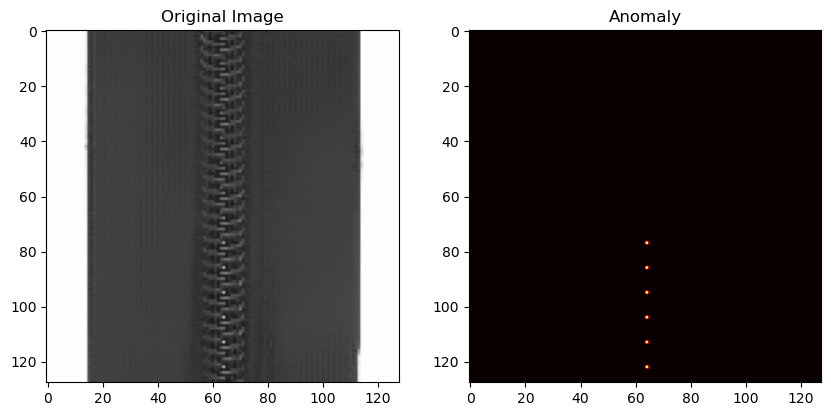

Is the new image defective? True
1/1 [==============================] - 0s 32ms/step


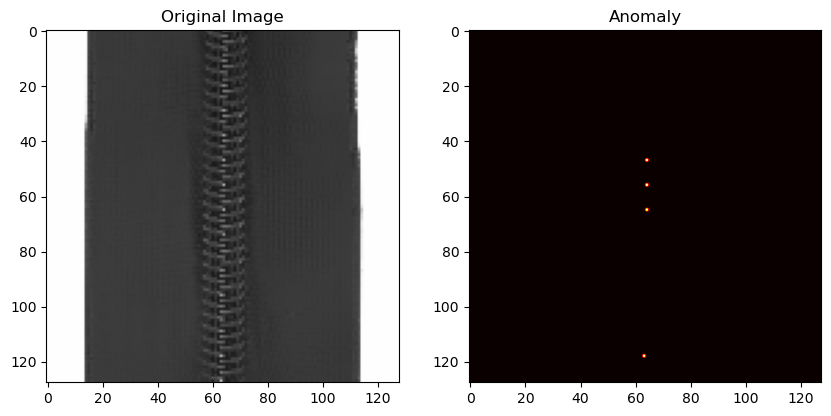

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


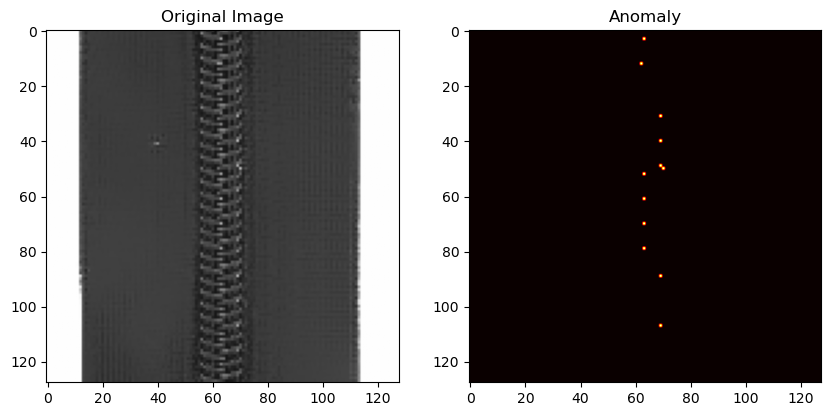

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


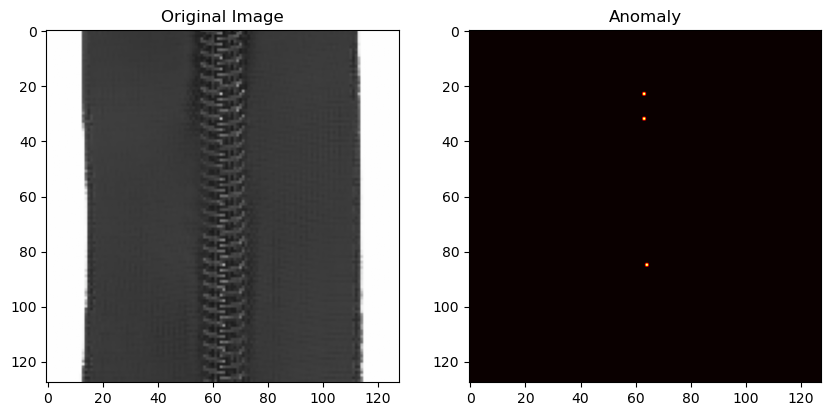

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


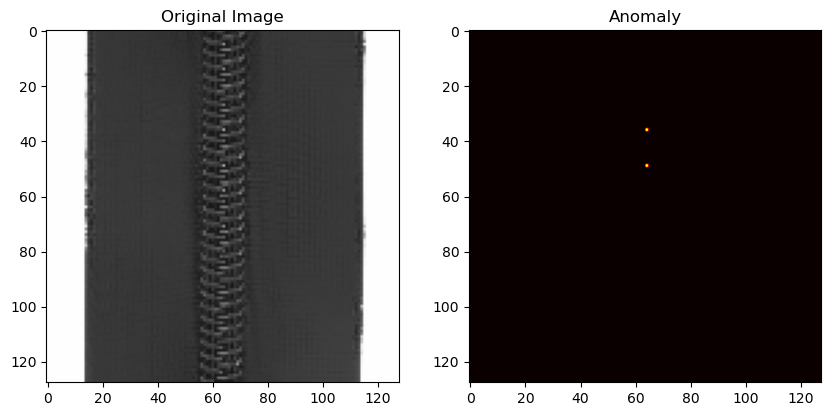

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


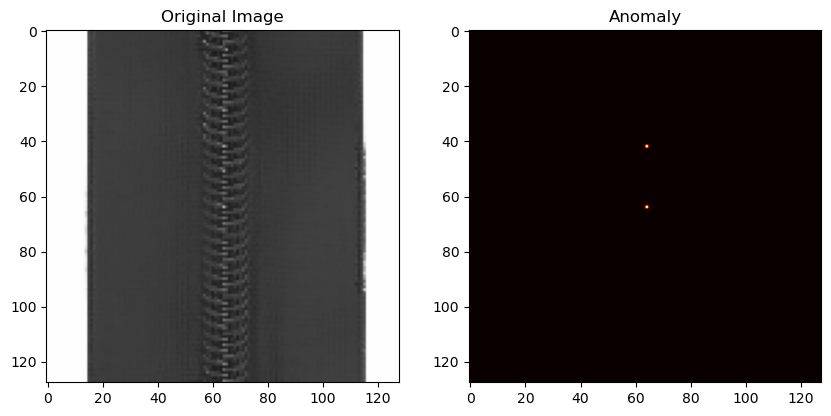

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


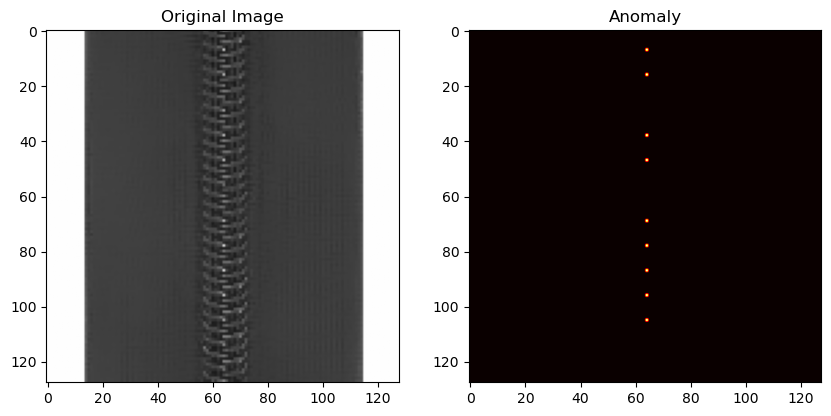

Is the new image defective? True
1/1 [==============================] - 0s 27ms/step


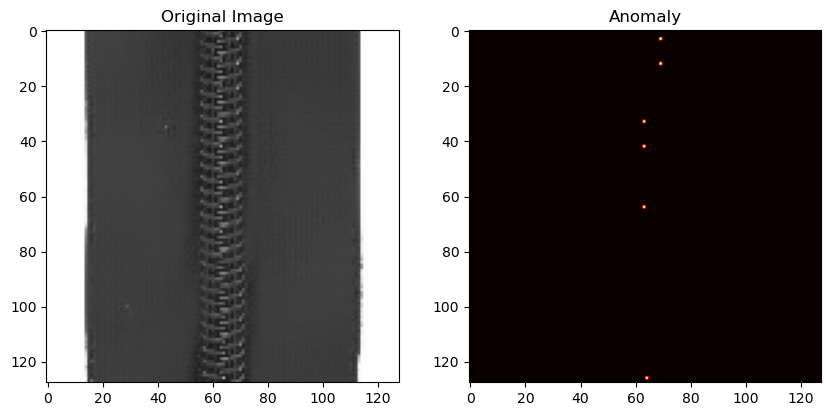

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


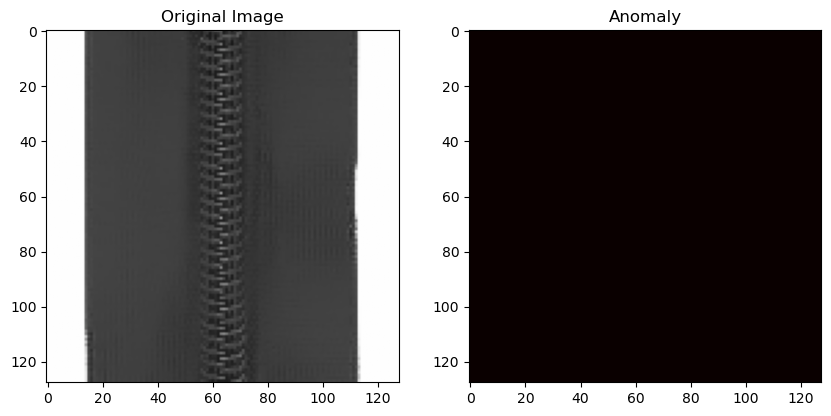

Is the new image defective? False
1/1 [==============================] - 0s 23ms/step


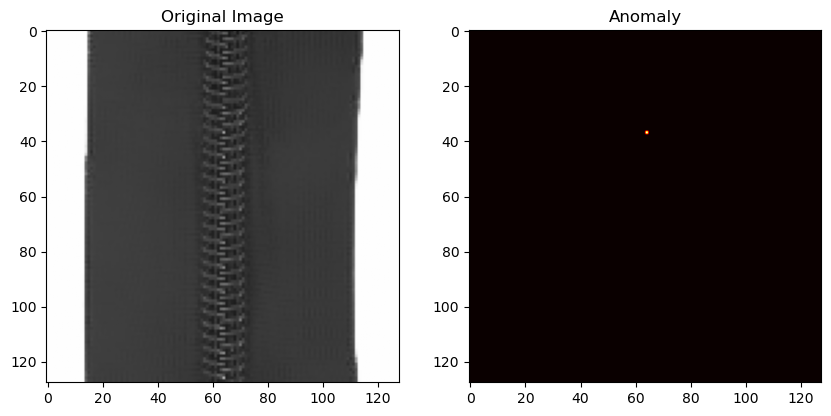

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


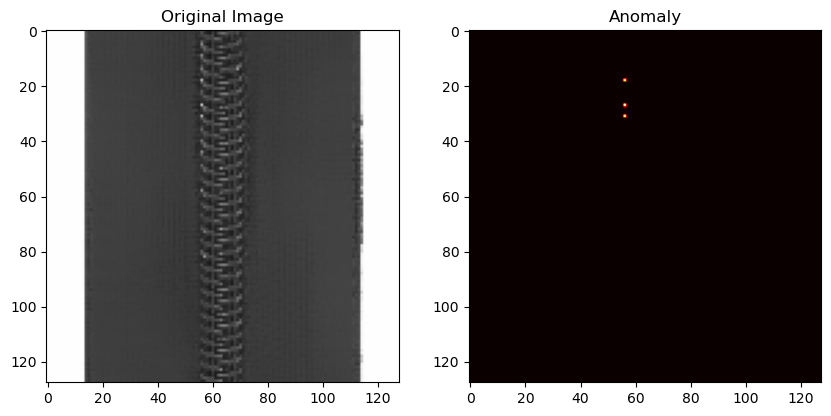

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


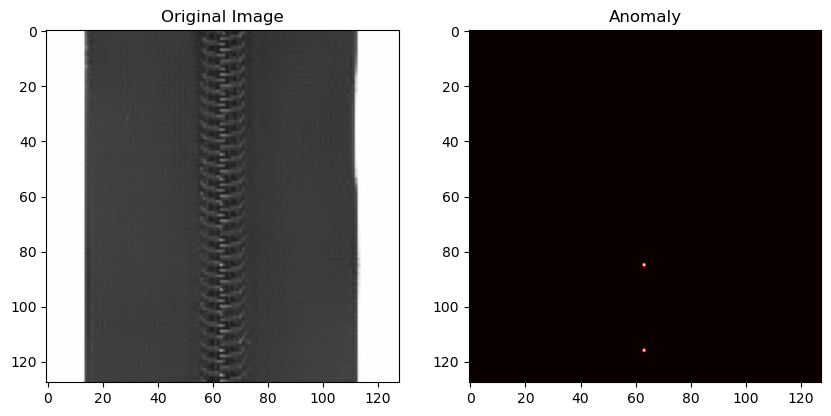

Is the new image defective? True
1/1 [==============================] - 0s 18ms/step


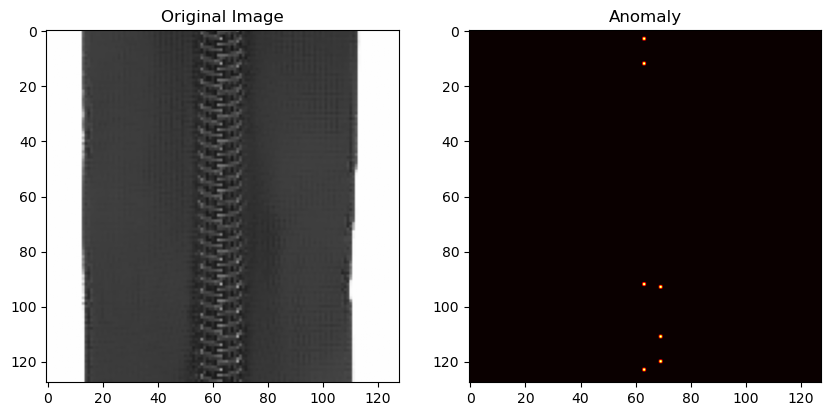

Is the new image defective? True
1/1 [==============================] - 0s 36ms/step


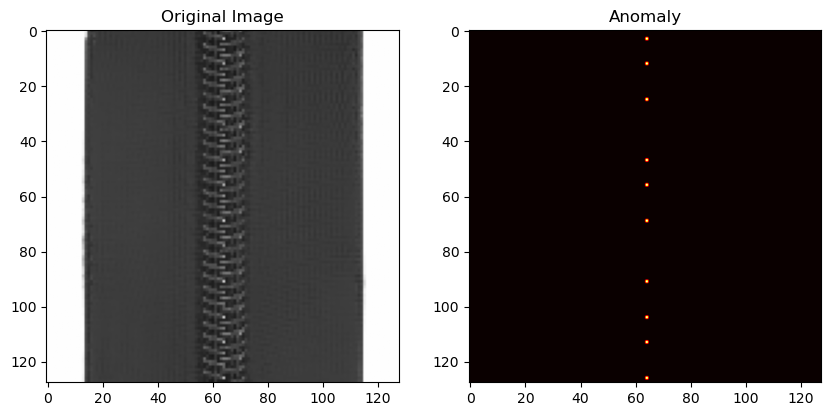

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


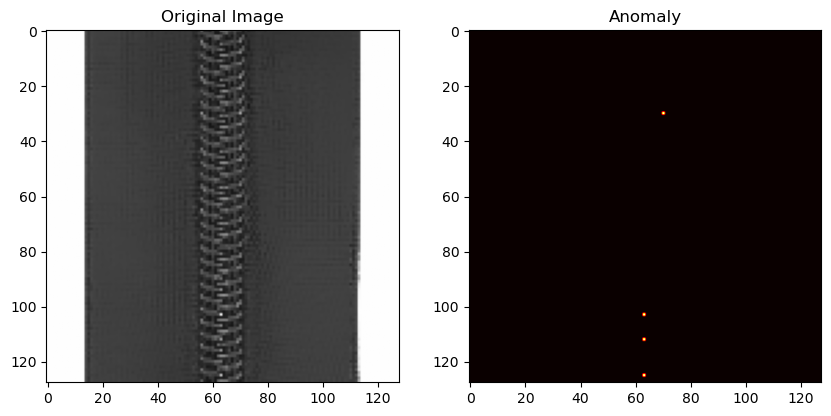

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


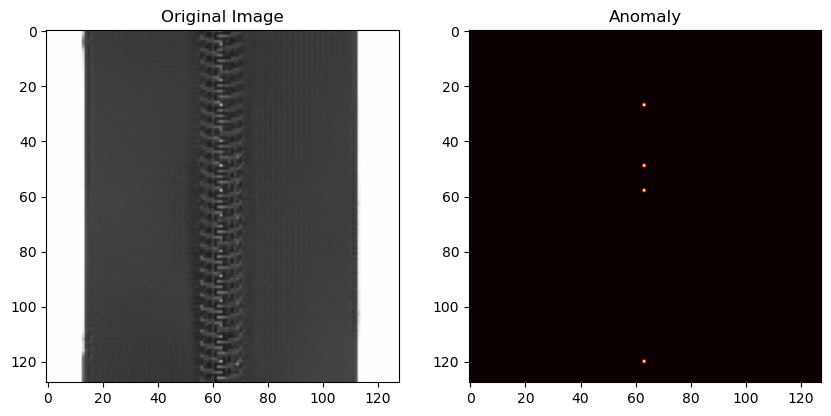

Is the new image defective? True
1/1 [==============================] - 0s 40ms/step


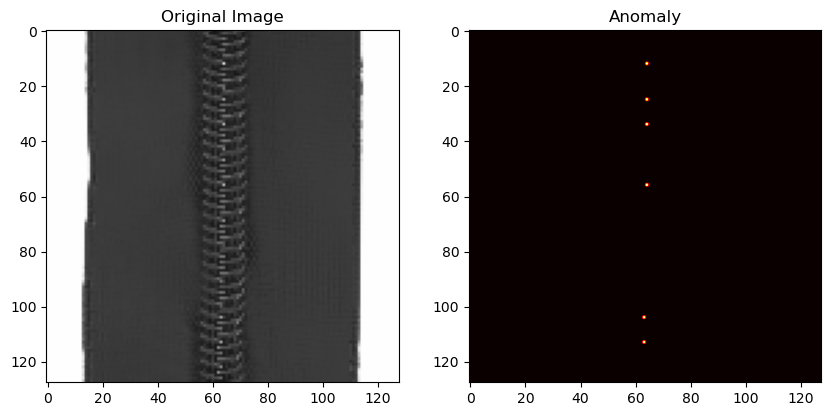

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


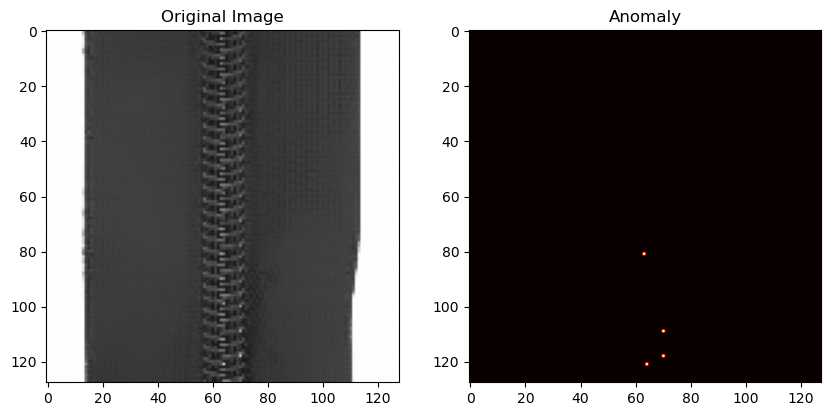

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


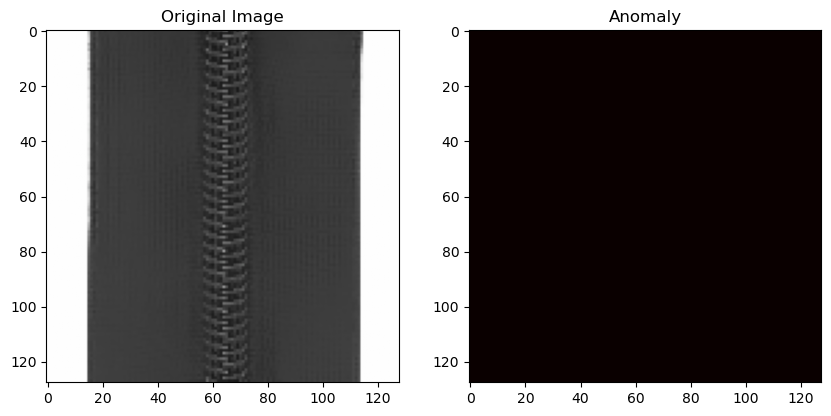

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


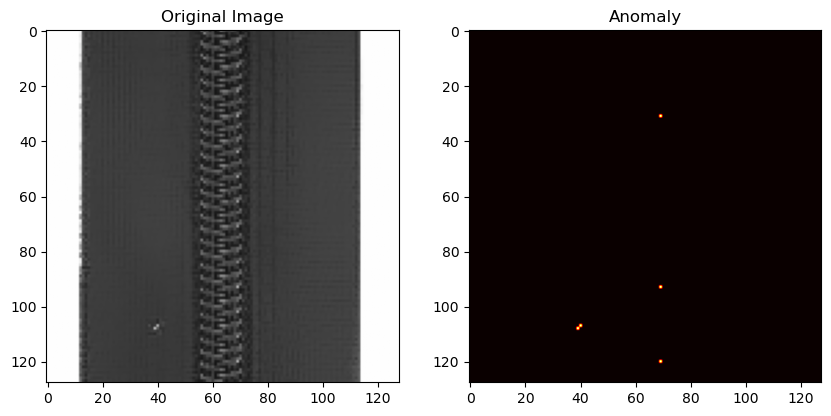

Is the new image defective? True
1/1 [==============================] - 0s 38ms/step


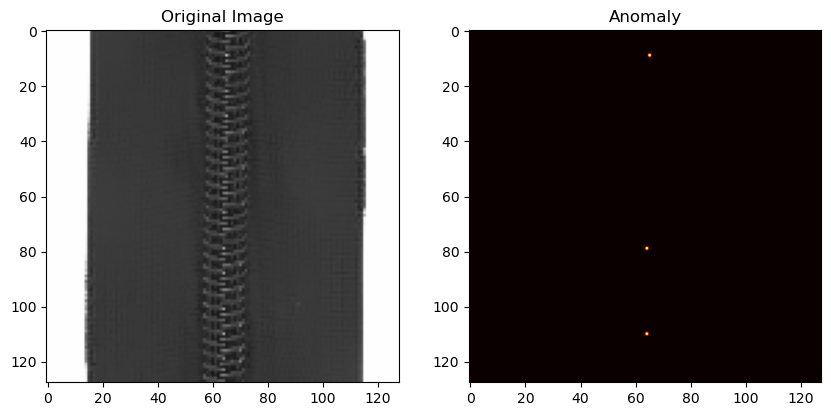

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


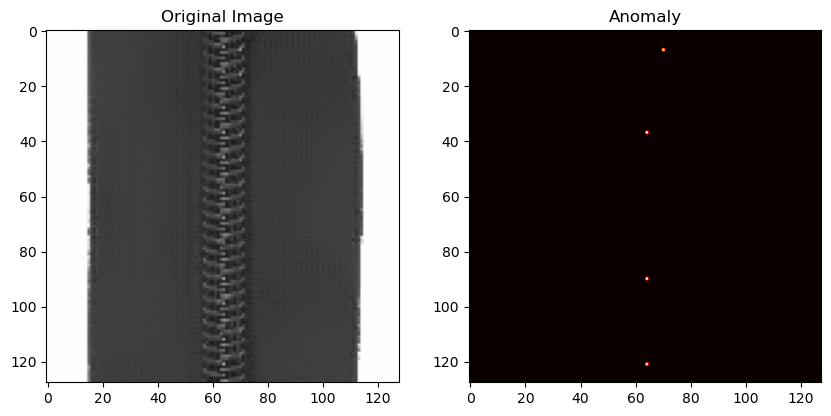

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


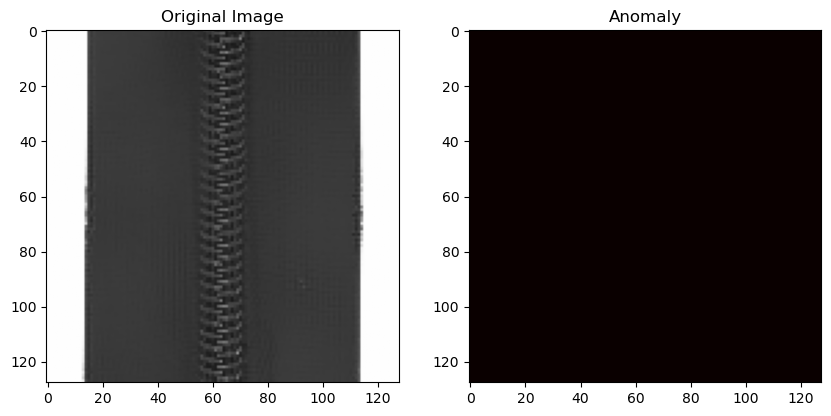

Is the new image defective? False
1/1 [==============================] - 0s 27ms/step


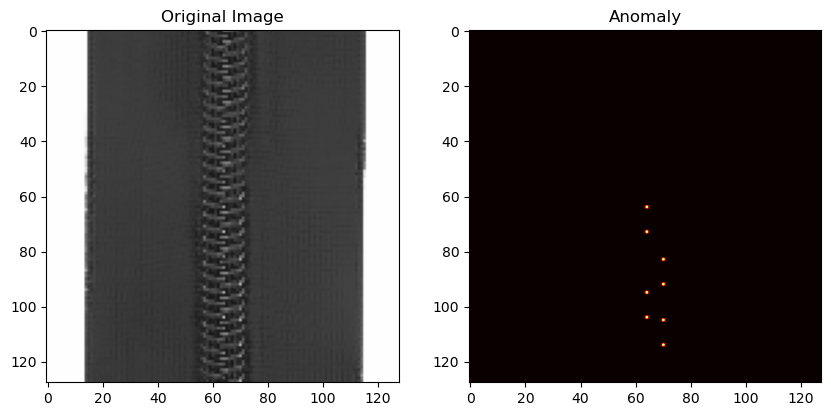

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


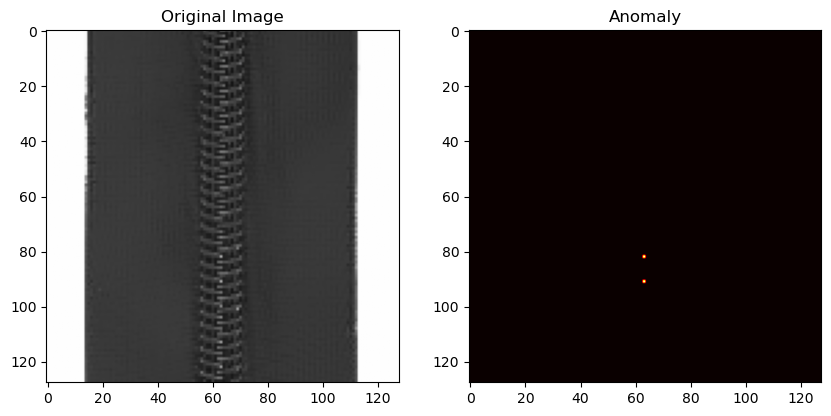

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


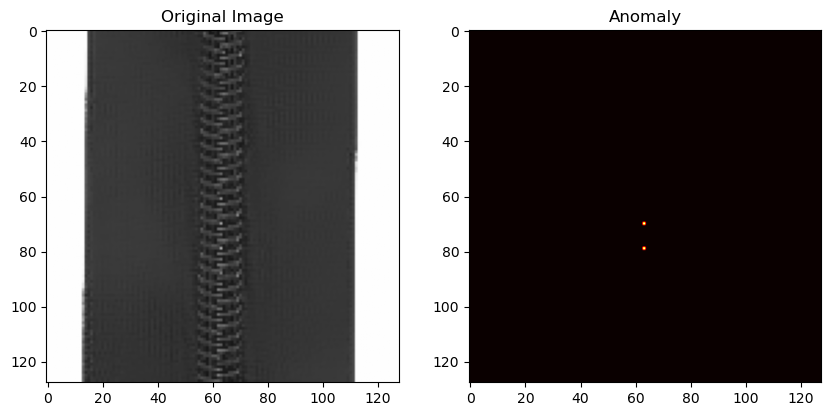

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


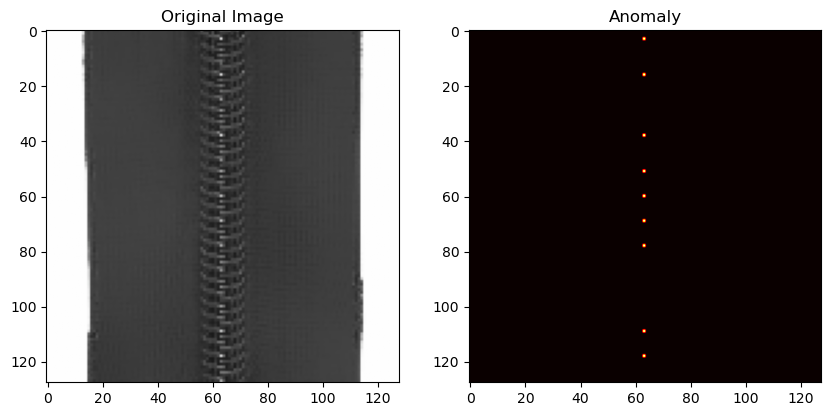

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


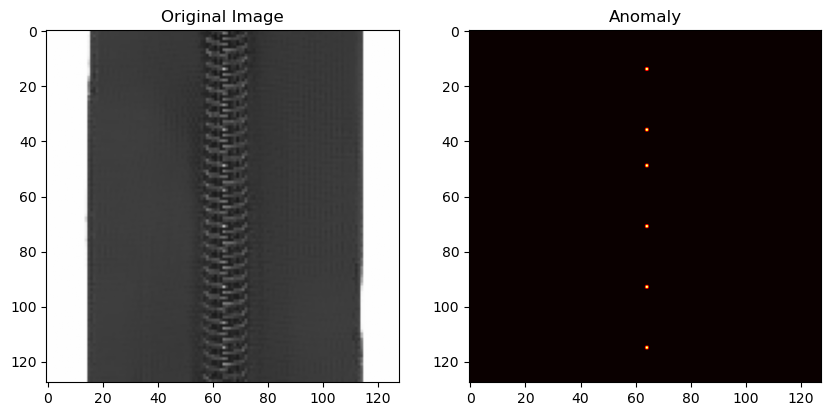

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


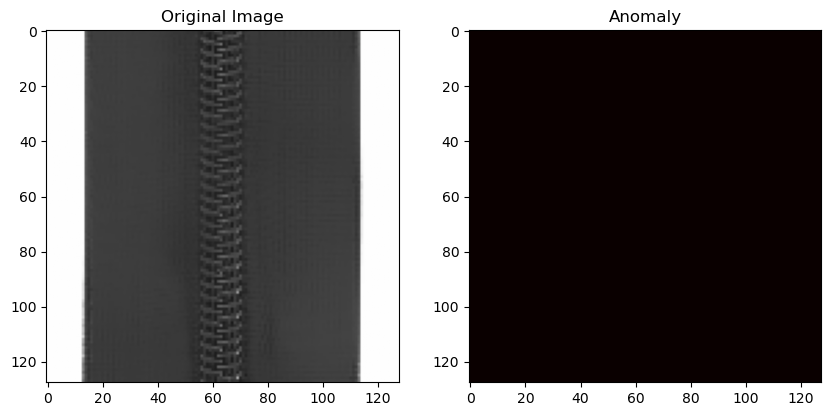

Is the new image defective? False
1/1 [==============================] - 0s 23ms/step


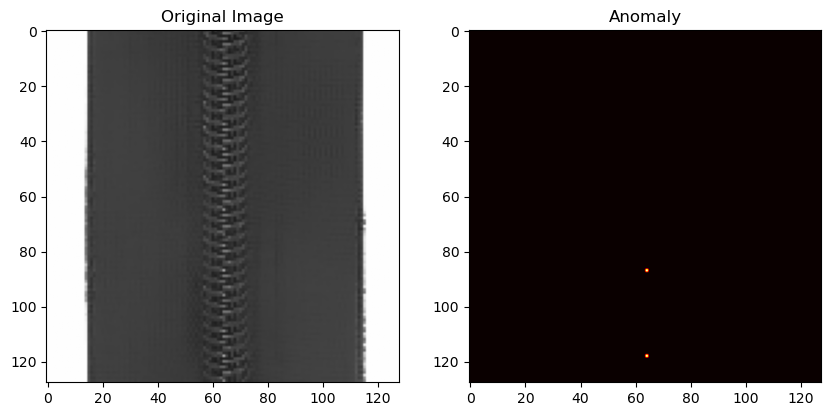

Is the new image defective? True
1/1 [==============================] - 0s 19ms/step


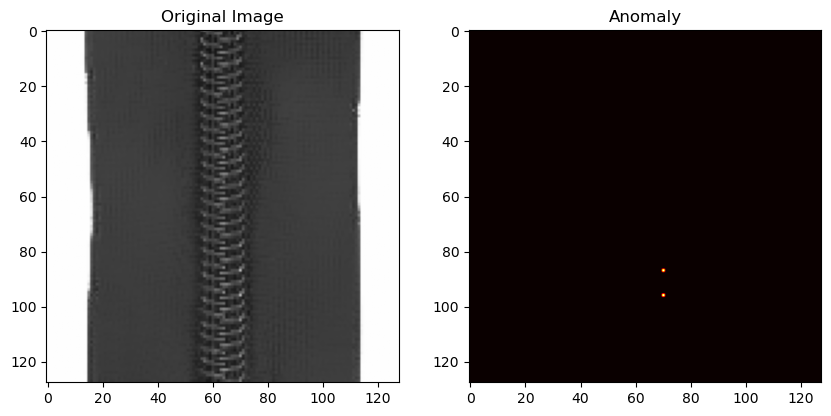

Is the new image defective? True
1/1 [==============================] - 0s 31ms/step


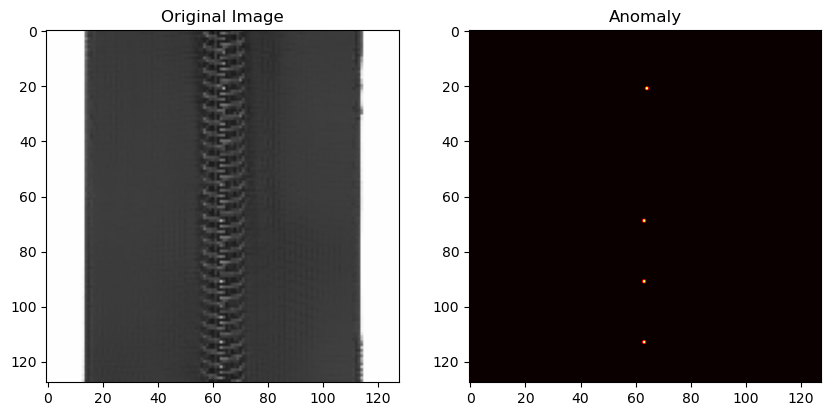

Is the new image defective? True
1/1 [==============================] - 0s 32ms/step


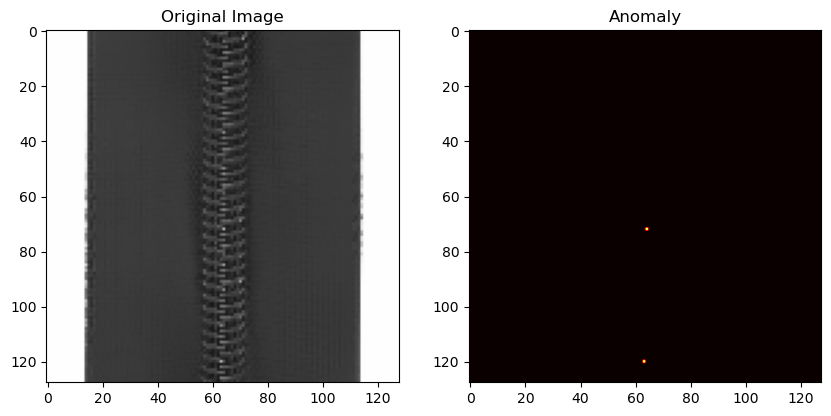

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


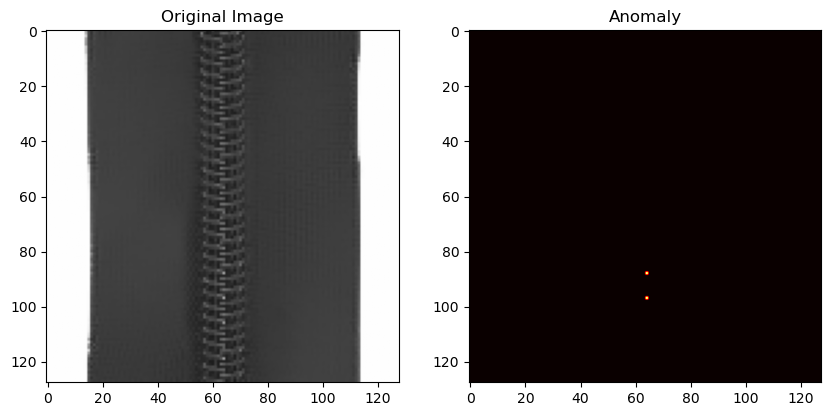

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


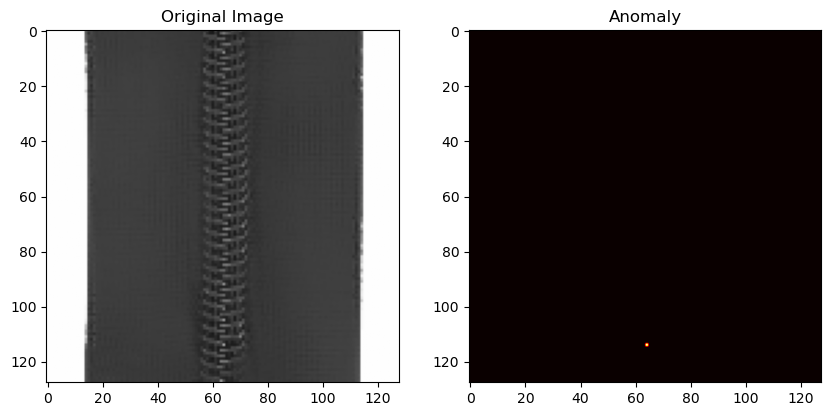

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


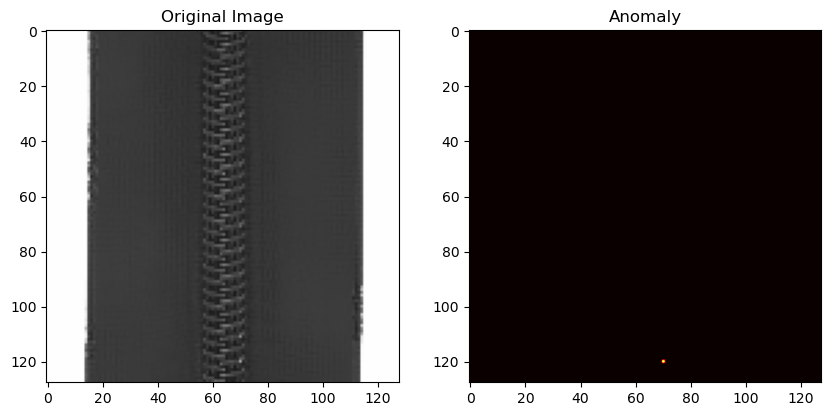

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


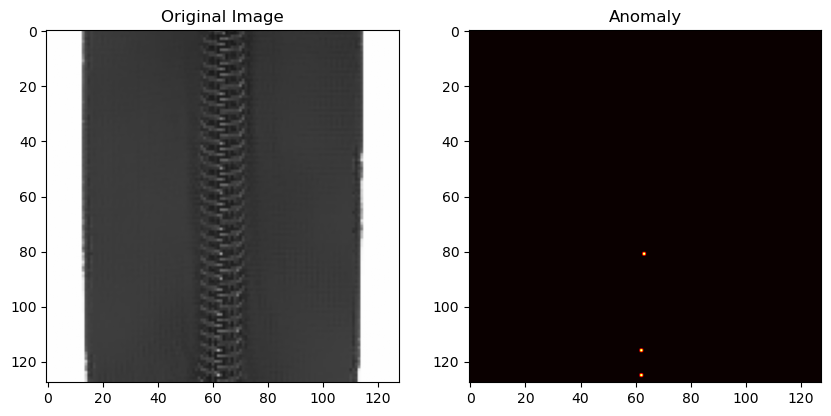

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


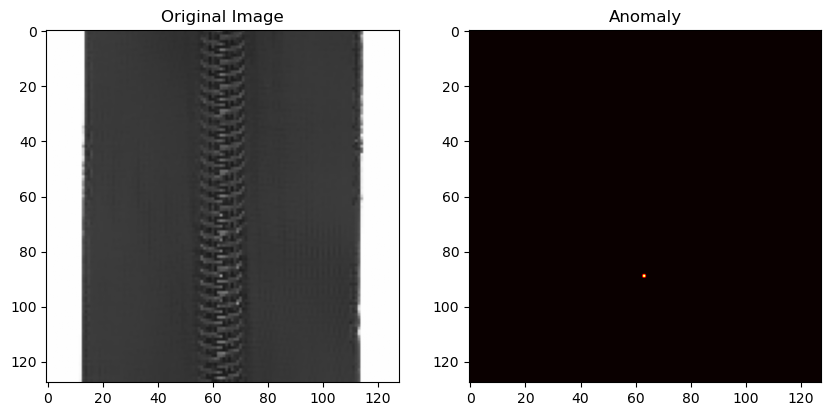

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


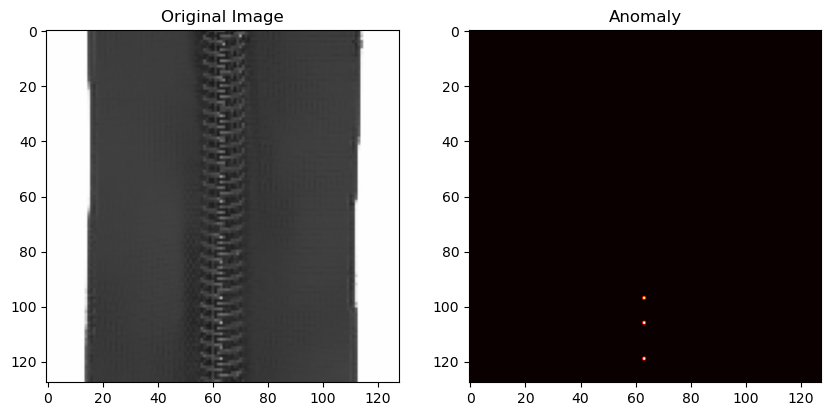

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


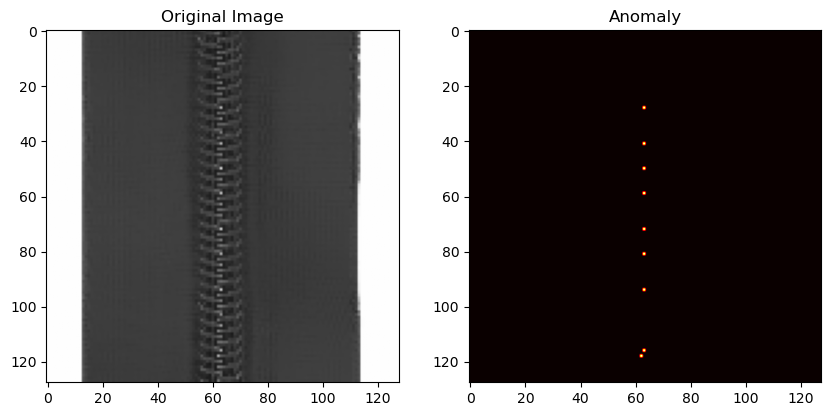

Is the new image defective? True
1/1 [==============================] - 0s 33ms/step


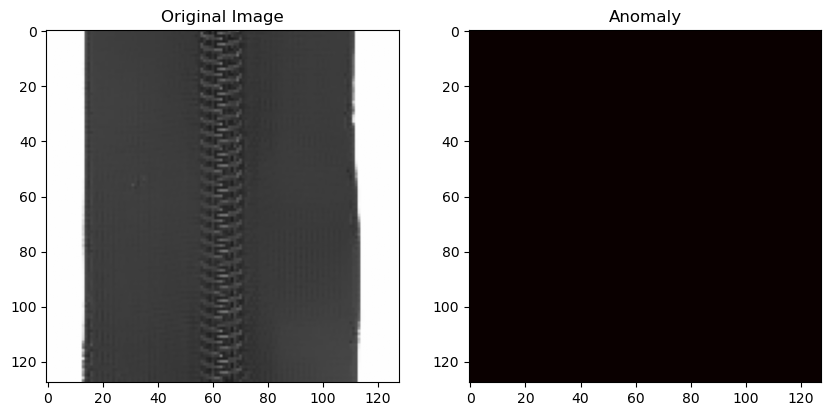

Is the new image defective? False
1/1 [==============================] - 0s 23ms/step


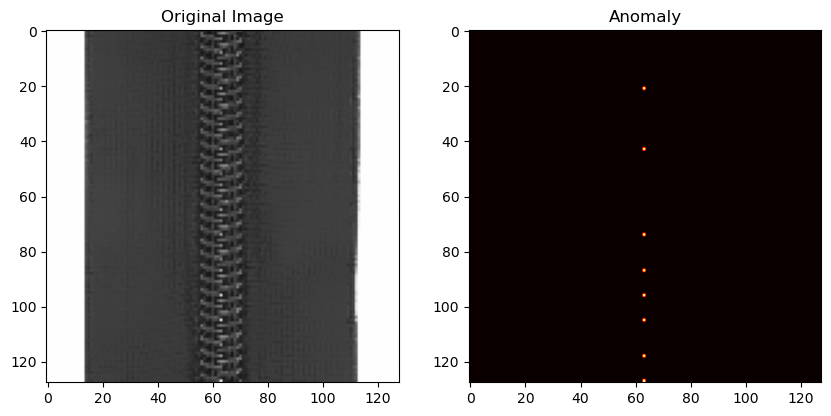

Is the new image defective? True
1/1 [==============================] - 0s 27ms/step


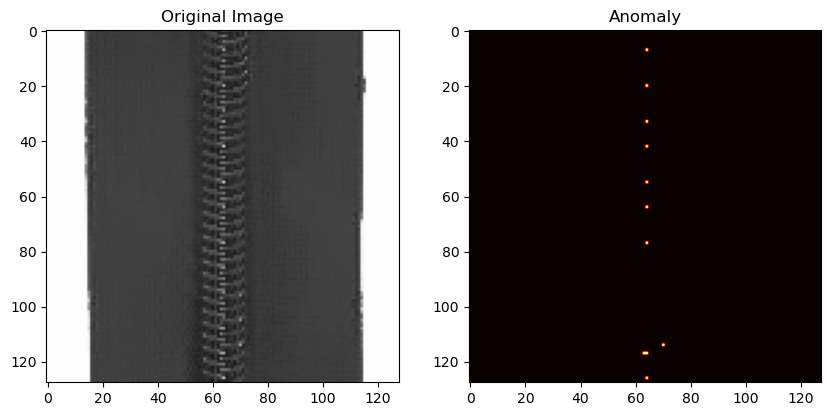

Is the new image defective? True
1/1 [==============================] - 0s 24ms/step


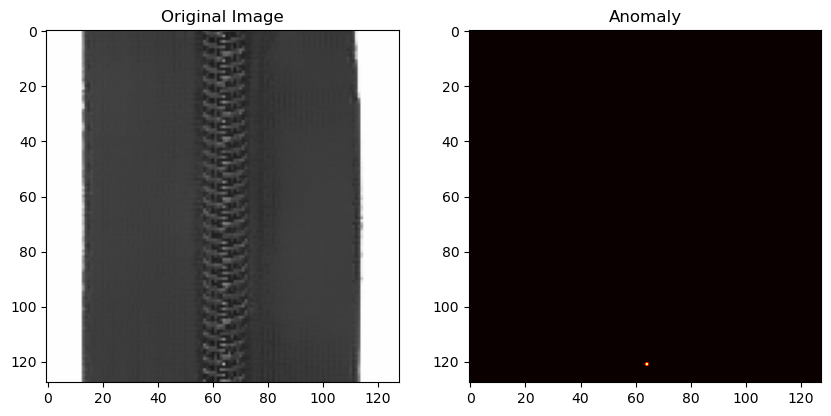

Is the new image defective? True
1/1 [==============================] - 0s 25ms/step


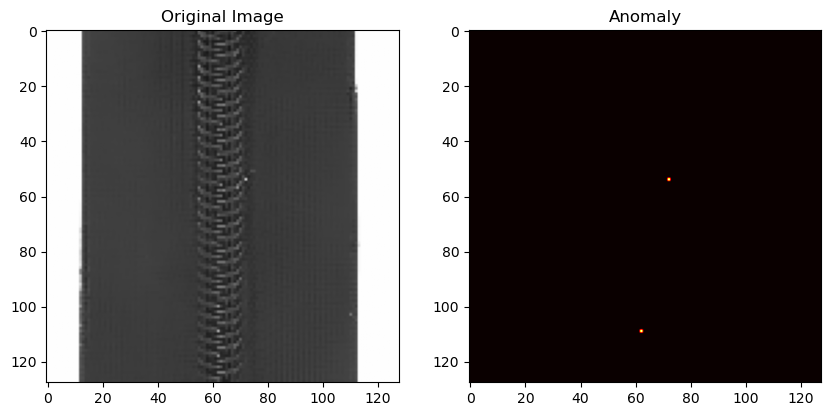

Is the new image defective? True
1/1 [==============================] - 0s 18ms/step


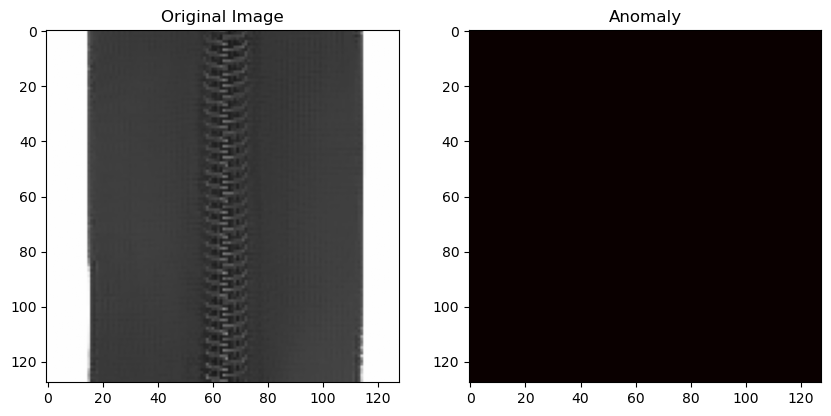

Is the new image defective? False


In [43]:
for ig in x_test[y_test==29]:
    is_defective = detect_defect(ig,0.2)
    print("Is the new image defective?", is_defective)

Test on toothbrush images

In [54]:
x_train_toothbrush = x_train[(y_train==23)]
autoencoder.fit(x_train_toothbrush, x_train_toothbrush, epochs=12, batch_size=44, shuffle=True)

Epoch 1/12
2/2 [==============================] - 1s 191ms/step - loss: 0.3928
Epoch 2/12
2/2 [==============================] - 1s 198ms/step - loss: 0.3870
Epoch 3/12
2/2 [==============================] - 1s 168ms/step - loss: 0.3820
Epoch 4/12
2/2 [==============================] - 1s 172ms/step - loss: 0.3791
Epoch 5/12
2/2 [==============================] - 1s 184ms/step - loss: 0.3809
Epoch 6/12
2/2 [==============================] - 1s 180ms/step - loss: 0.3794
Epoch 7/12
2/2 [==============================] - 1s 206ms/step - loss: 0.3787
Epoch 8/12
2/2 [==============================] - 1s 185ms/step - loss: 0.3768
Epoch 9/12
2/2 [==============================] - 1s 167ms/step - loss: 0.3764
Epoch 10/12
2/2 [==============================] - 1s 157ms/step - loss: 0.3762
Epoch 11/12
2/2 [==============================] - 1s 163ms/step - loss: 0.3757
Epoch 12/12
2/2 [==============================] - 1s 190ms/step - loss: 0.3753


1/1 [==============================] - 0s 22ms/step


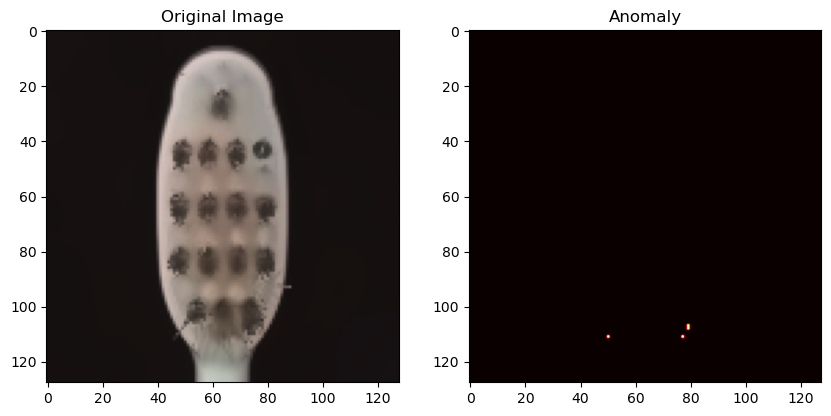

Is the new image defective? True
1/1 [==============================] - 0s 26ms/step


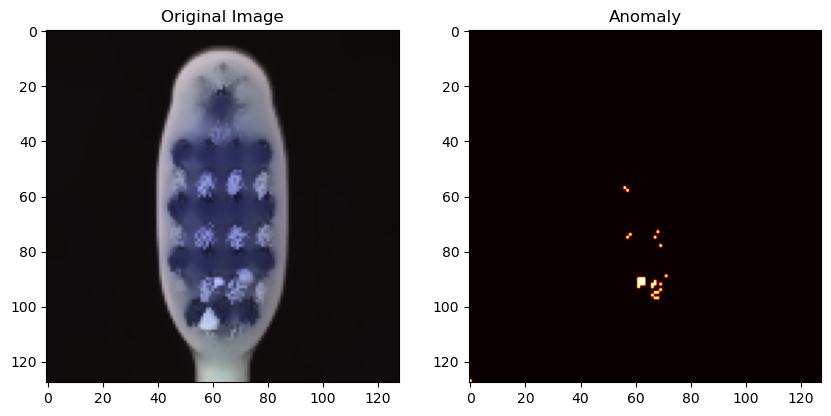

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


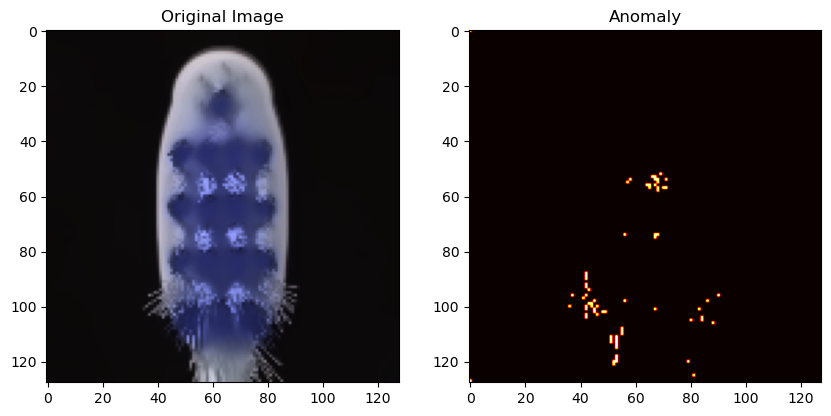

Is the new image defective? True
1/1 [==============================] - 0s 18ms/step


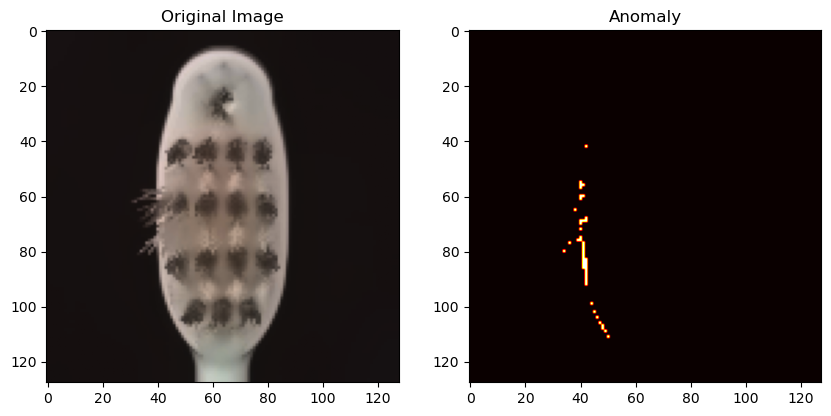

Is the new image defective? True
1/1 [==============================] - 0s 31ms/step


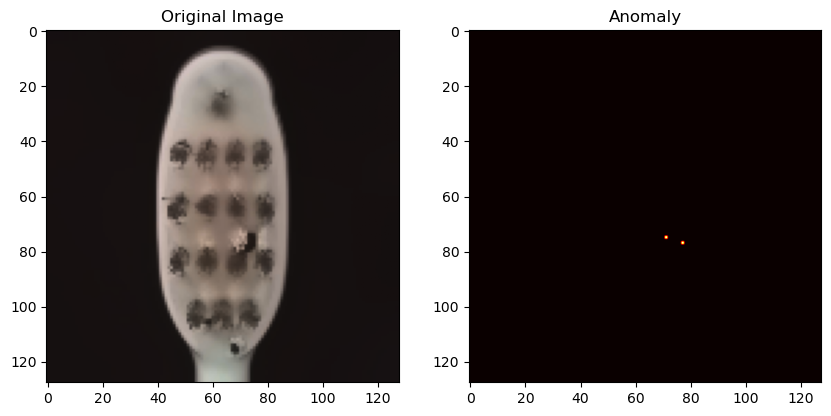

Is the new image defective? True
1/1 [==============================] - 0s 21ms/step


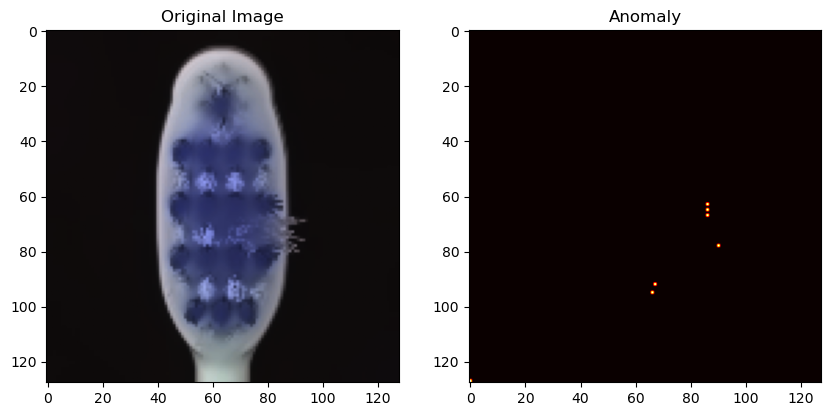

Is the new image defective? True


In [58]:
for ig in x_test[y_test==22]:
    is_defective = detect_defect(ig,0.13)
    print("Is the new image defective?", is_defective)

1/1 [==============================] - 0s 20ms/step


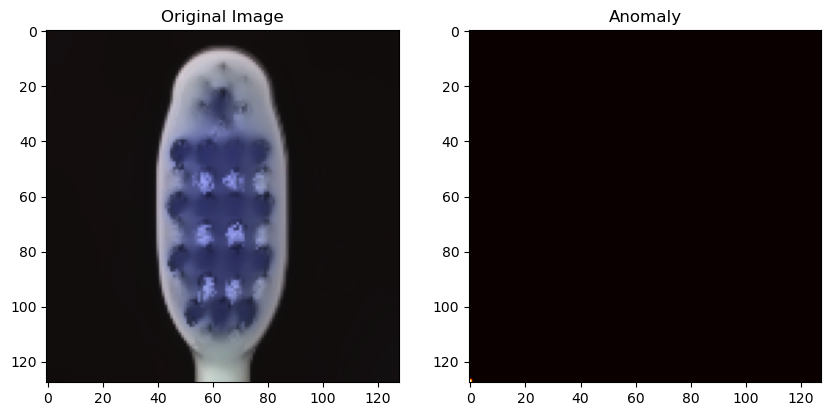

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


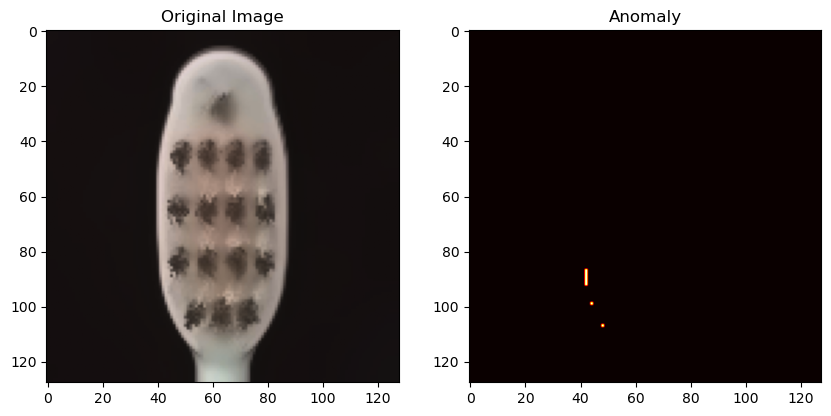

Is the new image defective? True
1/1 [==============================] - 0s 38ms/step


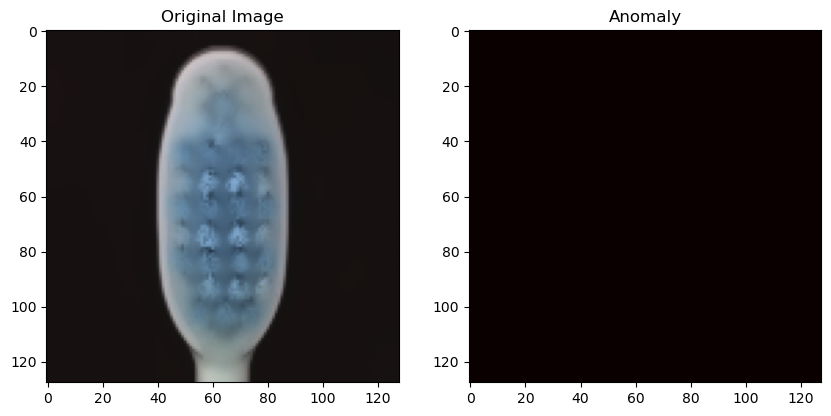

Is the new image defective? False
1/1 [==============================] - 0s 20ms/step


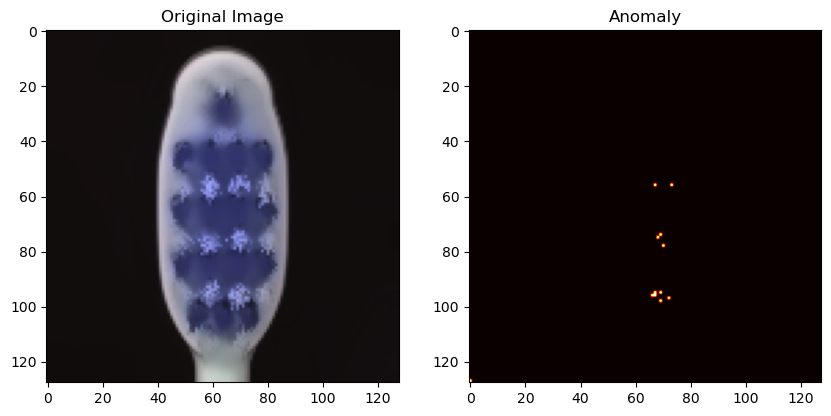

Is the new image defective? True
1/1 [==============================] - 0s 20ms/step


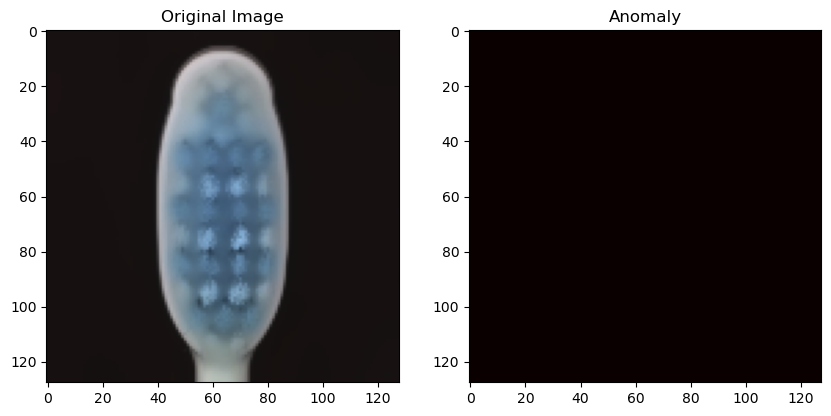

Is the new image defective? False
1/1 [==============================] - 0s 20ms/step


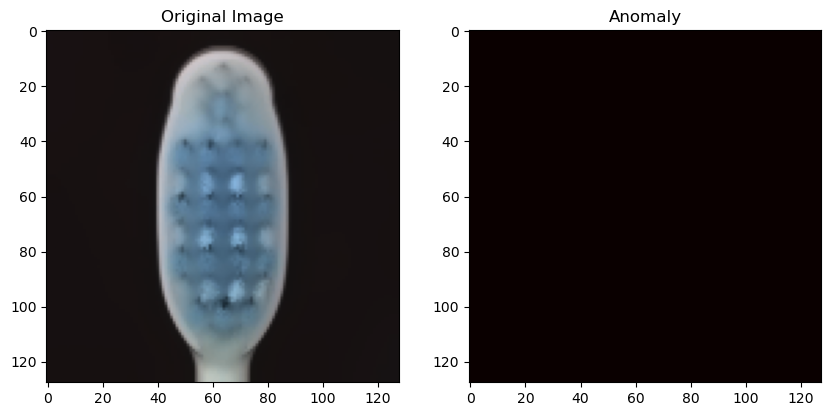

Is the new image defective? False
1/1 [==============================] - 0s 22ms/step


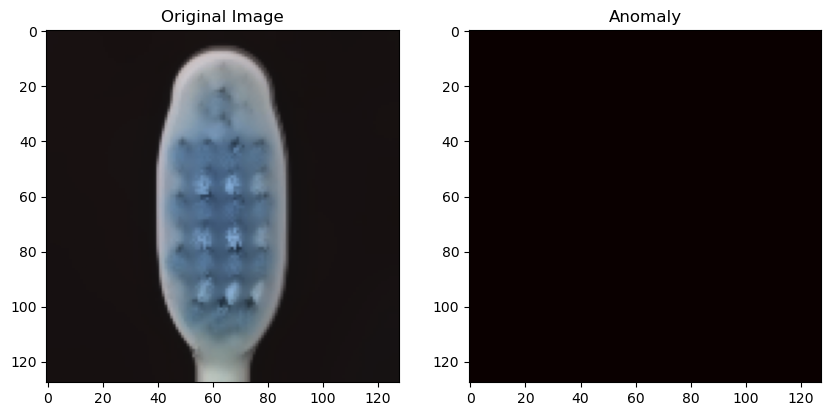

Is the new image defective? False
1/1 [==============================] - 0s 20ms/step


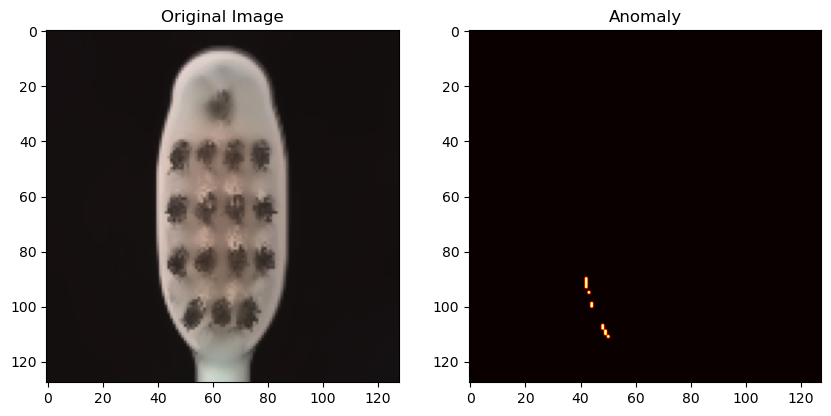

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


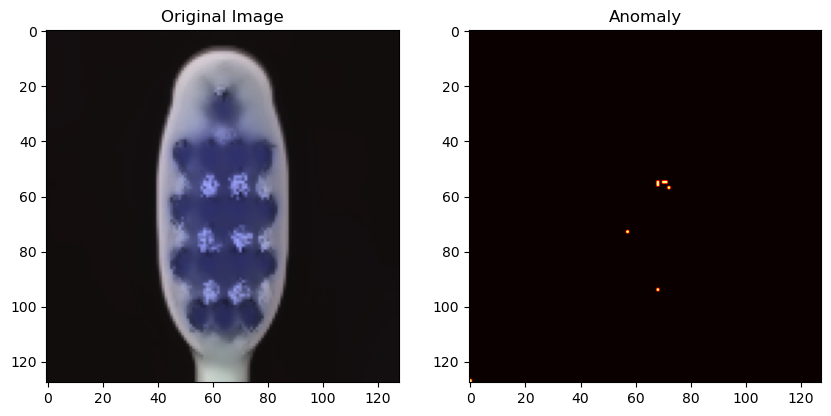

Is the new image defective? True
1/1 [==============================] - 0s 22ms/step


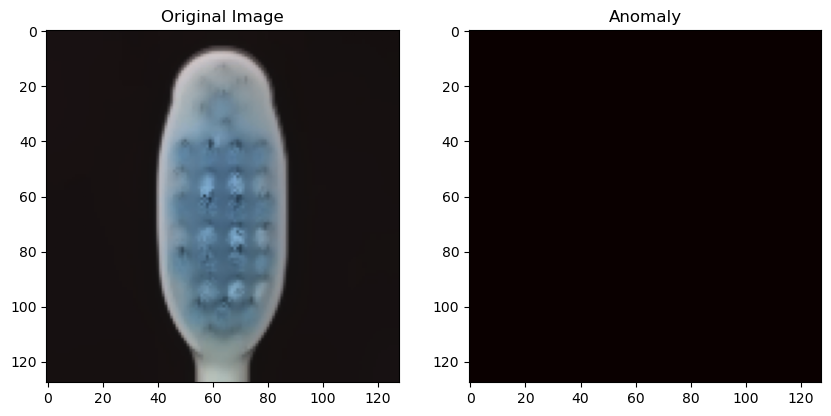

Is the new image defective? False
1/1 [==============================] - 0s 20ms/step


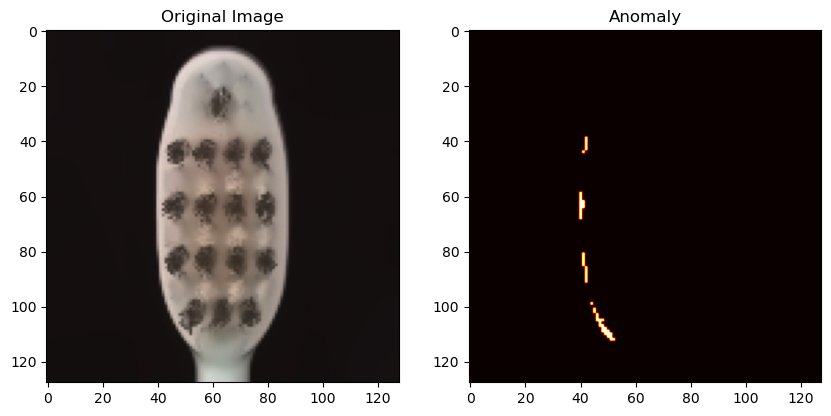

Is the new image defective? True
1/1 [==============================] - 0s 34ms/step


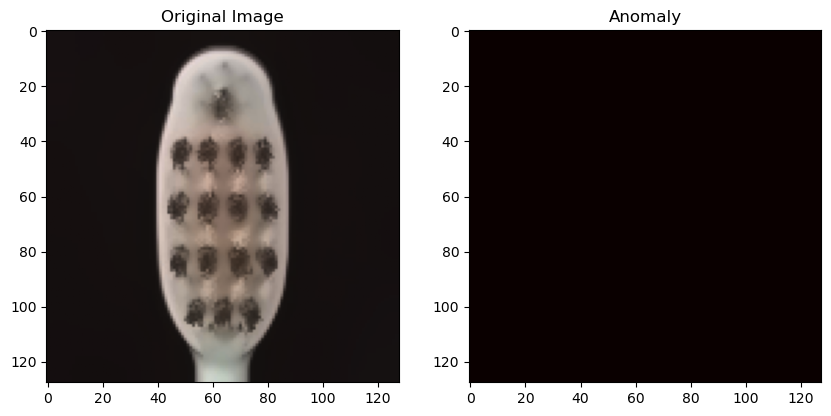

Is the new image defective? False
1/1 [==============================] - 0s 21ms/step


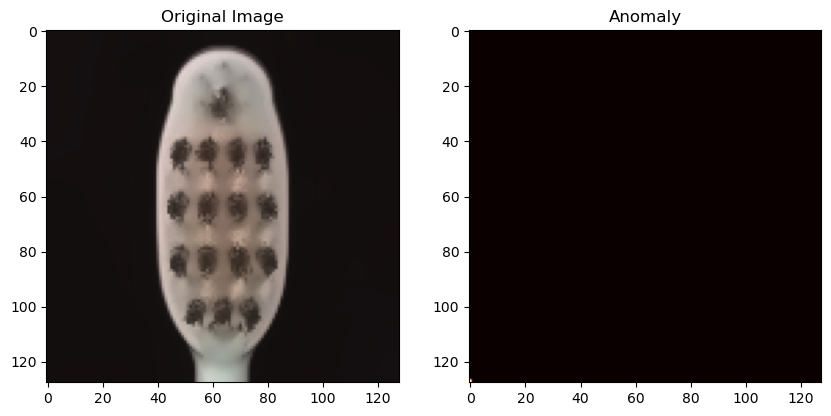

Is the new image defective? True
1/1 [==============================] - 0s 23ms/step


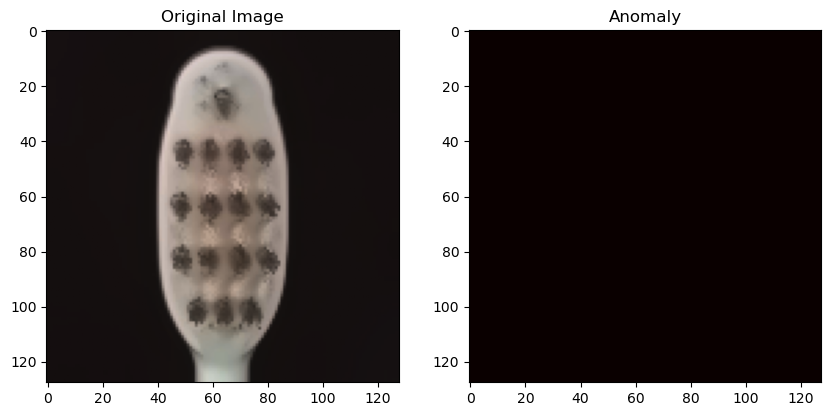

Is the new image defective? False


In [59]:
for ig in x_test[y_test==23]:
    is_defective = detect_defect(ig,0.13)
    print("Is the new image defective?", is_defective)